<a id="2"></a>
<h2 style="background-color:light yellow;font-family:monospace;font-size:300%;text-align:center">BANK CREDIT CARD CUSTOMER MARKETING STRATEGY REPORT </h2>

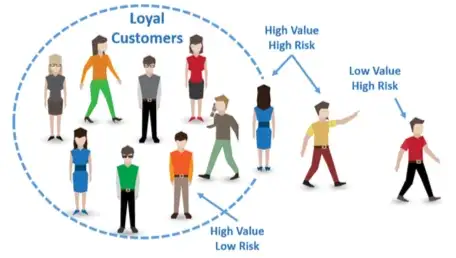
(Original Image from https://www.dunnsolutions.com)

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">TABLE OF CONTENT</h1>


* [<font color='red'>**1. Executive Summary**](#)
* [<font color='red'>**2. Defining the Task**](#)
* [<font color='red'>**3. Business Understanding**](#)
* [<font color='red'>**4. Define the Approach**](#)
* [<font color='red'>**5. Data at a Glance**](#)
    - [5.1 Load data](#)
    - [5.2 Feature description](#)
    - [5.3 Missing values and unique Values](#)
    - [5.4 Target label](#)
    
* [<font color='red'>**6. EDA**](#)
    - [6.1 Univariate analysis](#)
        - [6.1.1 Numerical data](#)
        - [6.1.2 Categorical data](#)
    - [6.2 Multivariate analysis](#)
        - [6.2.1 Pearson correlation between numerical features](#)
        - [6.2.2 phiK analysis between all columns (num + cat + churn)](#)
    
* [<font color='red'>**7. Customer Segmentation**](#)
    - [7.1 Segmentation strategies](#)
    - [7.2 Customer segmentation based on demographic features](#)
        - [7.2.1 Data processing](#)
        - [7.2.2 Kmodes clustering](#)
        - [7.2.3 Summary](#)
    - [7.3 Customer segmentation based on behavioral features](#)
        - [7.3.1 Data processing](#)
        - [7.3.2 Kmeans clustering](#)
        - [7.3.3 Clustering visulization](#)
        - [7.3.4 Cluster chracterization](#)
        - [7.3.5 Demographic information of customer segments](#)    
    - [7.4 Summary of customer segmentation](#)
    
* [<font color='red'>**8. Data Preprocessing for Churn Prediction**](#)
    - [8.1 Feature engineering](#)
    - [8.2 Feature selection](#)
        - [8.2.1 Data processing](#)
        - [8.2.2 Split df into X and y](#)
        - [8.2.3 Feature selection](#)  
    - [8.3 SMOTE](#)
        - [8.3.1 Set up features for modeling](#)
        - [8.3.2 Train test split](#) 
        - [8.3.3 Apply SMOTE](#) 
    
* [<font color='red'>**9. Churn Model**](#)
    - [9.1 Model selection](#)
    - [9.2 Model tuning](#)
    - [9.3 SHAP](#)    

* [<font color='red'>**10. Model Deployment**](#)
* [<font color='red'>**11. Marketing Strategies Recommendation**](#)

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">1. EXECUTIVE SUMMARY</h1>

### <font color='red'>"Focus on the right message for the right people at the right time."</font>

The manager at our bank was disturbed with more and more customers leaving our credit card services in the past year. As customesr churn rate continues to rise, we aim to improve our Customer Relationship Management (CRM) and the marketing strategy in an attempt to reverse the trend.

This report is an attempt at providing actionable marketing strategies by identifying segments of customers with with high Return of Investment (ROI). It explores data with three prime perspectives-

1. What customers are we losing?
    - Behaviors and insights analysis to characterize churners.
2. Why are we losing them?
    - Machine learning modeling and feature importance analysis to identify key factors contribute to customer churn.
3. How can we stop them from losing?
    - Customer segmentation to locate at risk customers with high ROI for marketing.
    - Providing actionable solutions to Customer management team 

Using the best suited analytical approach, it then throws light on churn prediction with recommendations to curb it and suggests effective marketing strategies for customer base retention and possibly, growth.

The key finding of this report is that customers with lower average balance, lower transactions, and lower product utilization are more likely to churn. We furture xxxxxxxxxxx

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">2. DEFINING THE TASK</h1>

Although it's been over a decade since the 2008 global financial crisis, there are still plenty of lessons to be learned from this particular economic downturn. One important lesson is that many businesses, nce emphasizing heavily on growing new customers, start to realize the importance of keeping existing customers. Studies suggest bagging new customers could be anywhere from 5 to 25 times more cost-incurring than holding on to an existing one, reported a Harvard Business Review. Given the direct impact of that on revenue, wisdom would certainly lie in putting in that effort to retain old customers – which would still be modest – considering the rewarding revenue versus going about getting new customers to maintain the customer base.

Our top priority in this business problem is to identify customers who are getting churned and key factors behind those decisions. Eventually we can provide our Customer relationship management team with high ROI customers at risk, and actionable solutions on marketing strategies.

Even if we predict non-churning customers as churned, it won't harm our business. But predicting churning customers as Non-churning will do. So **recall** (TP/TP+FN) is going to be the model evaluation metric in the study.

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">3. BUSINESS UNDERSTANDING</h1>

https://medium.com/@tabul8tor/how-do-credit-cards-work-a15596e14860

1. Credit card business: Issuer (Banks) vs Network (MC, Visa, AE, Discover)
<div>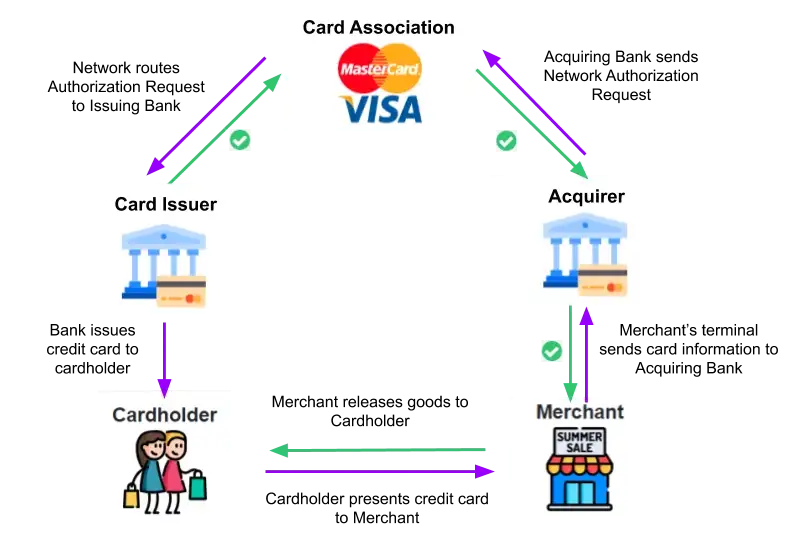</div> 

2. How Do Credit Card Companies Make Money?
- Interest (caldholders)
- Interchange or Merchant fees (Merchants)
- Fees
    - Annual Fees
    - Cash Advance Fees
    - Balance Transfer Fees
    - Late Fees

3. General strategies to grow credit card customers
- Provide Multiple Card Types.
- Offer a Balance Transfer Program. 
- Credit Limit Increases. ...
- Adjust Lending Policies. ...
- Consistently Marketing your Card Program.

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">4. DEFINE THE APPROACH</h1>

The journey from the problem to insights discovery and solution building is displayed below.

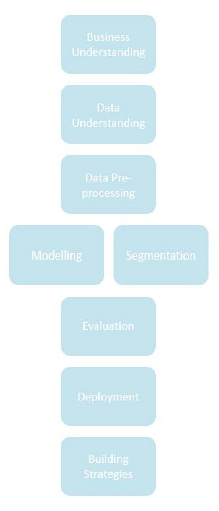

### Credit Card Customer Segmentation: 
(https://www.linkedin.com/pulse/credit-card-customer-segmentation-jay-shah/)
- Kmodes clustering for demographic features since most columns are categorical
- Kmeans clustering for behavioral features since most columns are numeric

### Churn: classfication models
- feature engineering and feature selection to reduce feature dimensionality
- compare logistci regression and tree based models for performance

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">5. DATA AT A GLANCE</h1>

The dataset contains information around 23 attributes for an approximate 10,000 customers. These attributes were divided into 6 categorical and 17 numerical features. The target label is binary information on churn

In [2]:
# necessary package for basic libraries and visulization
import numpy as np 
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
#from plotnine import *

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# <span style="color:magenta">5.1 Load Data

In [3]:
df = pd.read_csv('BankChurners.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [4]:
n_unique = df.nunique()
print("Number of unique values:\n{}".format(n_unique))

Number of unique values:
CLIENTNUM                                                                                                                             10127
Attrition_Flag                                                                                                                            2
Customer_Age                                                                                                                             45
Gender                                                                                                                                    2
Dependent_count                                                                                                                           6
Education_Level                                                                                                                           7
Marital_Status                                                                                                                         

In [5]:
# column CLIENTNUM contain Uunique identifier for the customer - not useful for model building
# Last two column contains not useful information
# We are going to drop these 3 columns
df = df.drop(columns = [ 'CLIENTNUM',
              'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1', 
             'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'])

# <span style="color:magenta">5.2 Feature Description 

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

Below is the description of all columns

|Feature|Description|
|----------|:------------------------------------------------------------------------------|
|Attrition_Flag |Label - customer churn info|
|Customer_Age   |Demographic variable - Customer's Age in Years|
|Gender         |Demographic variable - M=Male, F=Female|
|Dependent_count|Demographic variable - Number of dependents|
|Education_Level|Demographic variable - Educational Qualification of the account holder|
|Marital_Status |Demographic variable - Married, Single, Divorced, Unknown|
|Income_Category|Demographic variable - Annual Income Category of the account holder |
|Months_on_book          |Bank relation - Period of relationship with bank|
|Total_Relationship_Count|Bank relation - Total no. of products held by the customer|
|Months_Inactive_12_mon  |Bank relation - No. of months inactive in the last 12 months|
|Contacts_Count_12_mon   |Bank relation - No. of Contacts in the last 12 months|
|Card_Category           |Credit card - Product Variable - Type of Card (Blue, Silver, Gold, Platinum)|
|Credit_Limit            |Credit card - Credit Limit on the Credit Card|
|Total_Revolving_Bal     |Credit card - Total Revolving Balance on the Credit Card|
|Avg_Open_To_Buy         |Credit card - Open to Buy Credit Line (Average of last 12 months)|
|Total_Amt_Chng_Q4_Q1    |Credit card - Change in Transaction Amount (Q4 over Q1)|
|Total_Trans_Amt         |Credit card - Total Transaction Amount (Last 12 months)|
|Total_Trans_Ct          |Credit card - Total Transaction Count (Last 12 months)|
|Total_Ct_Chng_Q4_Q1     |Credit card - Change in Transaction Count (Q4 over Q1)|
|Avg_Utilization_Ratio   |Credit card - Average Card Utilization Ratio|

Features composition: We have a total of 19 features including 14 numerical and 5 categorical attributes

# <span style="color:magenta"> 5.3 Missing Values and Unique Values

In [7]:
print("No Missing Data in this Dataset",'\n')
print(df.isnull().sum())

No Missing Data in this Dataset 

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64


In [26]:
n_unique = df.nunique()
print("Number of unique values:\n{}".format(n_unique))

Number of unique values:
Attrition_Flag                 2
Customer_Age                  45
Gender                         2
Dependent_count                6
Education_Level                7
Marital_Status                 4
Income_Category                6
Card_Category                  4
Months_on_book                44
Total_Relationship_Count       6
Months_Inactive_12_mon         7
Contacts_Count_12_mon          7
Credit_Limit                6205
Total_Revolving_Bal         1974
Avg_Open_To_Buy             6813
Total_Amt_Chng_Q4_Q1        1158
Total_Trans_Amt             5033
Total_Trans_Ct               126
Total_Ct_Chng_Q4_Q1          830
Avg_Utilization_Ratio        964
dtype: int64


In [27]:
print("Unique values in each categorical column:", '\n')
for col in df.select_dtypes(include=[object]):
    if(col != 'Attrition_Flag'):
         print(col,":", df[col].unique())

Unique values in each categorical column: 

Gender : ['M' 'F']
Education_Level : ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status : ['Married' 'Single' 'Unknown' 'Divorced']
Income_Category : ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Card_Category : ['Blue' 'Gold' 'Silver' 'Platinum']


### Although there is no apprant missing values, there are category "unknown" in columns  Education_Level, Marital_Status and Income_Category. Need to treat that as missing values and consider ways to fillin.

# <span style="color:magenta"> 5.4 Target label

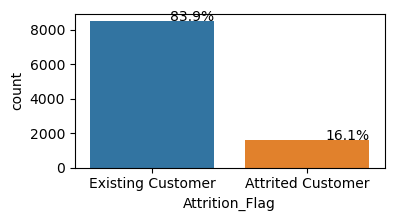

In [28]:
plt.figure(figsize=(4,2))
ax = sns.countplot(x=df['Attrition_Flag'])
total = len(df['Attrition_Flag'])
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='right')
plt.show()

### Target label is imbalanced. Need to consider balancing the data using either class weight or SMOTE


<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">6. EDA</h1>

We have a total of 19 features including 14 numerical and 5 categorical attributes

# <span style="color:magenta"> 6.1 Univariate analysis
### <span style="color:magenta">Purpose is to examine data distribution. Check how each feature correlates with label to get a sense how likely that feature contributes to label prediction.

## <span style="color:blue">6.1.1 Numerical data

In [8]:
# 14 numerical columns
num_col = df.select_dtypes(['int64','float64']).columns.to_list()
#num_col.remove('CLIENTNUM')
num_col

['Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

In [9]:
df[num_col].describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.0,46.325960,8.016814,26.0,41.000,46.000,52.000,73.000
Dependent_count,10127.0,2.346203,1.298908,0.0,1.000,2.000,3.000,5.000
Months_on_book,10127.0,35.928409,7.986416,13.0,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.0,3.812580,1.554408,1.0,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.0,2.341167,1.010622,0.0,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.0,2.455317,1.106225,0.0,2.000,2.000,3.000,6.000
Credit_Limit,10127.0,8631.953698,9088.776650,1438.3,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.0,1162.814061,814.987335,0.0,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.0,7469.139637,9090.685324,3.0,1324.500,3474.000,9859.000,34516.000
Total_Amt_Chng_Q4_Q1,10127.0,0.759941,0.219207,0.0,0.631,0.736,0.859,3.397


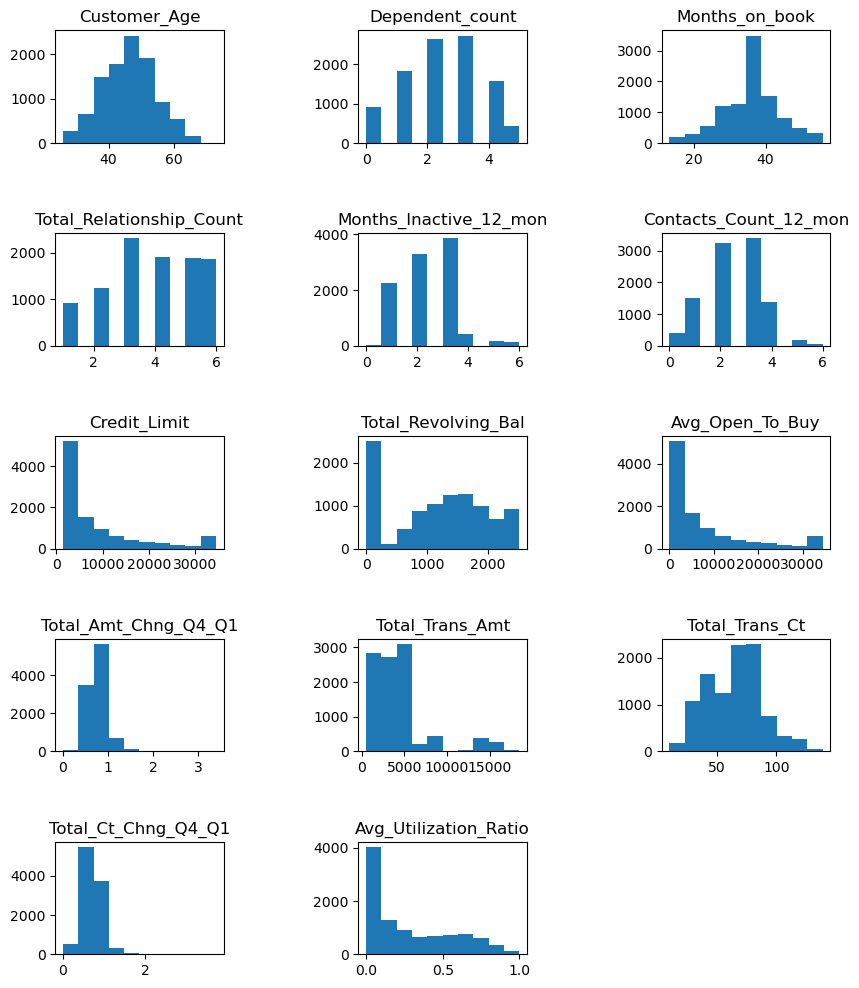

In [72]:
# check data distribution
fig = plt.figure(figsize=(10, 12))
fig.subplots_adjust(hspace=0.8, wspace=0.8)
for i,var in enumerate(num_col):
    ax = fig.add_subplot(5, 3, i+1)
    ax.hist(df[var])
    ax.set_title(var)

df.skew(): If skewness is positive, the data are positively skewed or skewed right, meaning that the right tail of the distribution is longer than the left. If skewness is negative, the data are negatively skewed or skewed left, meaning that the left tail is longer.

In [10]:
df[num_col].skew()

Customer_Age               -0.033605
Dependent_count            -0.020826
Months_on_book             -0.106565
Total_Relationship_Count   -0.162452
Months_Inactive_12_mon      0.633061
Contacts_Count_12_mon       0.011006
Credit_Limit                1.666726
Total_Revolving_Bal        -0.148837
Avg_Open_To_Buy             1.661697
Total_Amt_Chng_Q4_Q1        1.732063
Total_Trans_Amt             2.041003
Total_Trans_Ct              0.153673
Total_Ct_Chng_Q4_Q1         2.064031
Avg_Utilization_Ratio       0.718008
dtype: float64

### Data is skewed in some columns

### We next check how these features correlate with churn rate

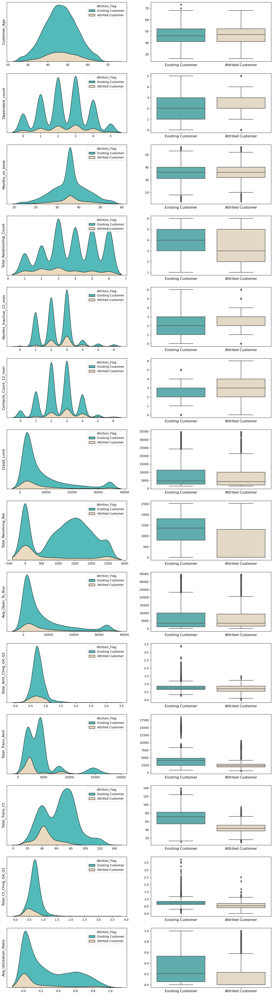

In [74]:
fig, ax = plt.subplots(ncols=2, nrows=14, figsize=(16, 60))                
i = 0 #counter
for cols in num_col:    
#     Removing Outliers     
#     Q3 = df[cols].quantile(0.99)
#     df = df[df[cols] <= Q3]
#     Q1 = df[cols].quantile(0.01)
#     df = df[df[cols] >= Q1]    
    sns.kdeplot(data= df, x=df[cols], fill=True, alpha=1, hue = 'Attrition_Flag', 
                palette=('#54BAB9', '#E9DAC1'), multiple='stack', ax=ax[i,0])
    
    sns.boxplot(data= df, y=cols, x='Attrition_Flag', ax=ax[i, 1],
               palette=('#54BAB9', '#E9DAC1'), color='white')
    ax[i,0].set_xlabel(' ')
    ax[i,1].set_xlabel(' ')
    ax[i,1].set_ylabel(' ')
    ax[i,1].xaxis.set_tick_params(labelsize=12)
    ax[i,0].tick_params(left=False, labelleft=False)
    ax[i,0].set_ylabel(cols, fontsize=12)
    i=i+1      
plt.show()

### <span style="color:red"> Features likely contribute to churn (data distribute differently between existing and churned customer:</span>
- <span style="color:red">Total_Relationship_Count
- <span style="color:red">Total_Revolving_Bal
- <span style="color:red">Total_Trans_Amt
- <span style="color:red">Total_Trans_Ct
- <span style="color:red">Avg_Utilization_Ratio
- <span style="color:red">Total_Amt_Chng_Q4_Q1
- <span style="color:red">Total_Ct_Chng_Q4_Q1

### <span style="color:green"> Features NOT likely contribute to churn (data distribute similarly between existing and churned customer:</span>
- <span style="color:green">Customer_Age
- <span style="color:green">Dependent_count
- <span style="color:green">Months_on_book
- <span style="color:green">Months_Inactive_12_mon
- <span style="color:green">Contacts_Count_12_mon
- <span style="color:green">Credit_Limit
- <span style="color:green">Avg_Open_To_Buy

## <span style="color:blue">6.1.2 Categorical data

In [11]:
cat_col = df.select_dtypes(['object']).columns.to_list()
#cat_col.remove('Attrition_Flag')
cat_col

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [12]:
df.Card_Category.value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

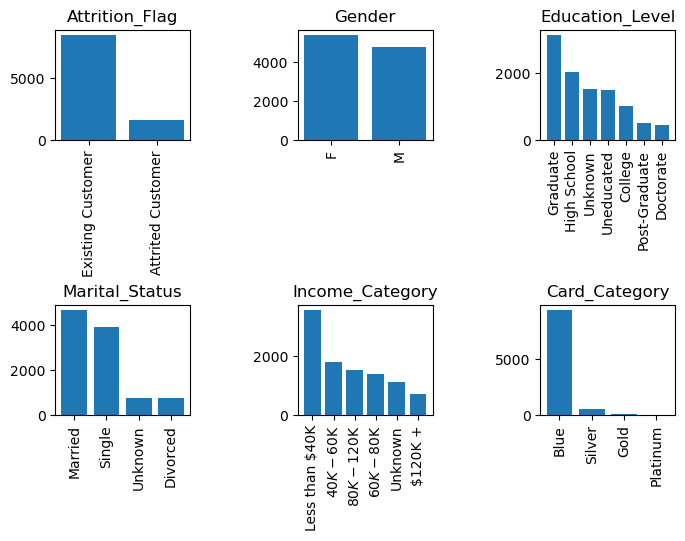

In [13]:
fig = plt.figure(figsize=(8, 5))
fig.subplots_adjust(hspace=1.5, wspace=0.8)
for i,var in enumerate(cat_col):
    tmp = df[var].value_counts().reset_index()
    ax = fig.add_subplot(2, 3, i+1)
    ax.bar(tmp['index'], tmp[var])
    ax.set_title(var)
    ax.tick_params(axis='x', labelrotation = 90)

### Categorical columns: 
- **Card_category is not useful. Most customers only have blue card.**
- **significant of Unknown customers in columns Educational_Level, Marital_status, and Income_Category.**

### We next check how these features correlate with churn rate

In [14]:
def countplot_churn(cat, data):
    fig, axes = plt.subplots(2, 3, figsize=(22, 16))
    fig.subplots_adjust(hspace=0.5, wspace=0.8)
    axes = axes.flatten()
    fig.suptitle('Categorical Features Distributions by Churn',fontsize=30)
    for ax, cat in zip(axes, cat):
        sns.countplot(x=cat,data=data,hue='Attrition_Flag',palette='rocket',ax=ax)
        ax.legend(title='Churn',loc='upper right',labels=['No', 'Yes'], fontsize=20)     
        ax.set_xticklabels(ax.get_xticklabels(),rotation=90,fontsize=12)
        plt.ylabel('Count', fontsize=20, weight='bold')

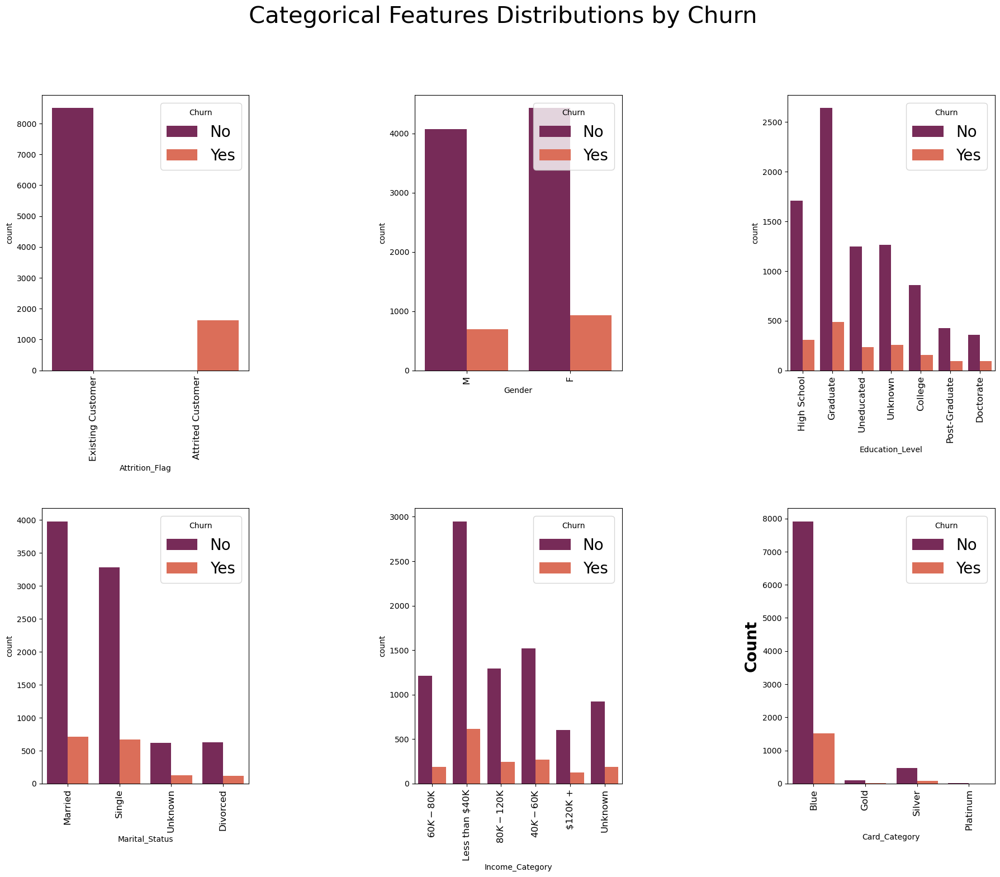

In [79]:
countplot_churn(cat_col, df)

In [ ]:
# # Plot crosstab percentages across the categorical columns based on Attrition_Flag values
# fig, axes = plt.subplots(nrows= 3, ncols=2, figsize=(30, 40) )
# #sns.set(font_scale=4) 
# (pd.crosstab(df[cat_col[0]], df["Attrition_Flag"], normalize="index") * 100).plot(
#             kind="bar",  stacked=True, ax=axes[0][0])
# (pd.crosstab(df[cat_col[1]], df["Attrition_Flag"], normalize="index") * 100).plot(
#             kind="bar",  stacked=True, ax=axes[0][1])
# (pd.crosstab(df[cat_col[2]], df["Attrition_Flag"], normalize="index") * 100).plot(
#             kind="bar",  stacked=True, ax=axes[1][0])
# (pd.crosstab(df[cat_col[3]], df["Attrition_Flag"], normalize="index") * 100).plot(
#             kind="bar",  stacked=True, ax=axes[1][1])
# (pd.crosstab(df[cat_col[4]], df["Attrition_Flag"], normalize="index") * 100).plot(
#             kind="bar",  stacked=True, ax=axes[2][0])

# plt.ylabel("Percentage Active/Inactive %")

### <span style="color:green"> Summary: all categorical features NOT likely contribute significantly to churn:</span>

- <span style="color:green"> Churn rate is slightly higher in female customers
- <span style="color:green"> Churn rate is slightly higher for customers with doctorate education. Doctorate category contains the least number of customers.
- <span style="color:green"> Churn rate is higher for customers with Platinum Card. But there are only a few customers with Platinum Card.    

### Some plotly plots of categorical columns: Churn Status/Attrition_Flag 
- imbalanced dataset

In [37]:
fig = make_subplots(rows=1, cols=2)
fig = px.pie(df,names='Attrition_Flag',title='Percentage of Existing and Attrited Customers',
             width=450, height=250, hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightBlue",
)
fig.show()
print('Total number of customers:',df['Attrition_Flag'].count())
print(df['Attrition_Flag'].value_counts())

Total number of customers: 10127
Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64


### Cat column: Gender 

In [38]:
fig = px.pie(df,names='Gender',title='Propotion Of Different Marriage Statuses',
             width=450, height=250, hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightBlue",
)
fig.show()

# <span style="color:magenta"> 6.2 Multivariate analysis
### <span style="color:magenta"> Purpose is to check correlations between features to find out if we have collinearity or multicollinearity between features. Chat-GPT claims collinearity is detrimental for all machine learning models including linear model, tree-based calssifiers and even KMeans clustering.

## <span style="color:blue"> 6.2.1 Pearson correlation between numerical features

Text(0.5, 1.0, 'Pearson correlation bewteen numerical features')

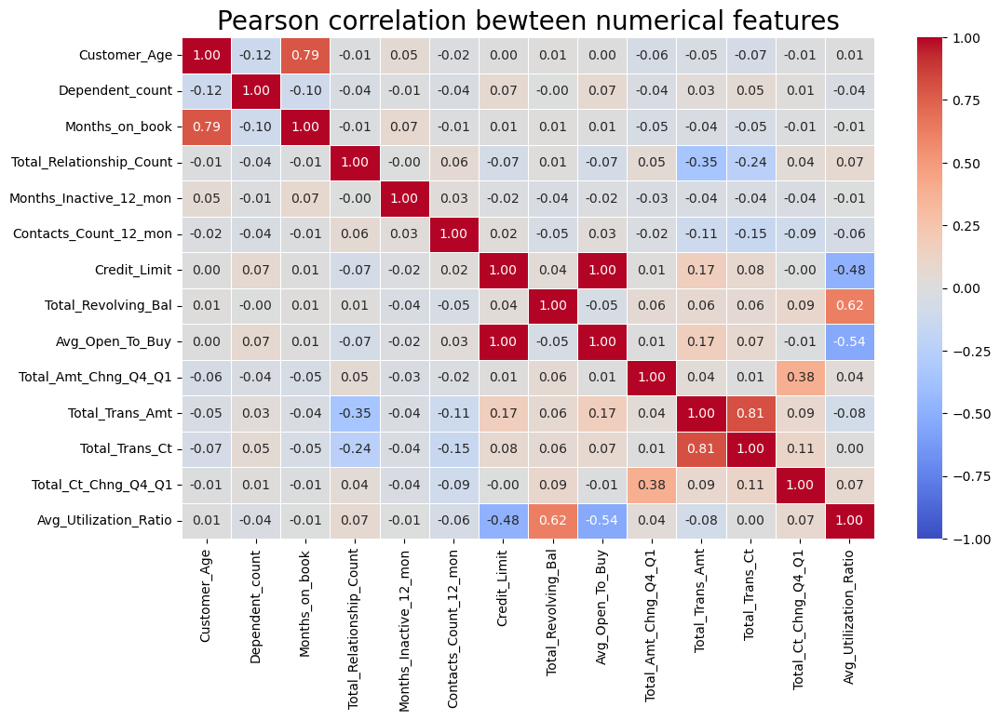

In [81]:
## Relationship between 2 numeric variables
plt.figure(figsize=(12,7))
sns.heatmap(df[num_col].corr(), 
            vmin=-1.0, 
            vmax=1.0, 
            linewidths=0.5, 
            cmap='coolwarm', 
            annot=True, 
            fmt='.2f')
plt.title('Pearson correlation bewteen numerical features', fontsize=20)

![title](img/numerical_data1.png)

### Insights from pearson correlation analysis of numerical features:
- **Total_Revolving_Bal = Credit_Limit - Avg_Open_To_Buy**
- **Avg_Utilization_Ratio = Total_Revolving_Bal  / credit limit**
- **Usually Total_Revolving_Bal is much smaller than Avg_Open_To_Buy. Thus Credit_Limit is close to Avg_Open_To_Buy in most columns. Correlation is 1.0 between them. We can drop Avg_Open_To_Buy column**
- **Customer_age correlates well with Months_On_Book (0.79)**
- **Total_Trans_Ct also well correlates with Total_Trans_Amt (0.81). This is also understandable.** 
- **Also correlates well are Total_Revolving_Bal and Ave_Utlization_Ratio.**

### <span style="color:red">Possible feature engineering with numerical features:</span>
- <span style="color:red">We should drop Avg_Open_To_Buy. Correlation is too strong.
- <span style="color:red">We can consider either drop one of these two olumns: Total_Trans_Amt and Total_Trans_Ct or, we can generate a new column Ave_Purchase_Price = Total_Trans_Amt / Total_Trans_Ct, since Total_Trans_Ct correlates well with Total_Trans_Amt (0.81). Not sure which way is better. Or we can use feature selection to see if we can eliminate one of them later?
- <span style="color:red"> Customer_age correlates well with Months_On_Book (0.79). Maybe we can also drop one of them. For example, drop Customer_age.  
- <span style="color:red">We will also perform phiK analysis on all columns and get an estimate how numerical features correlate with label (churn). 

## <span style="color:blue"> 6.2.2 phiK analysis between all columns (num + cat + churn)

### https://pypi.org/project/phik/
Phi_K is a practical correlation constant that works consistently between categorical, ordinal and interval variables. It is based on several refinements to Pearson’s hypothesis test of independence of two variables. Essentially, the contingency test statistic of two variables is interpreted as coming from a rotated bi-variate normal distribution, where the tilt is interpreted as Phi_K.

In [15]:
# for phiK correlation analysis
from scipy import stats
import phik
from phik import resources, report

In [16]:
df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

interval columns not set, guessing: ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


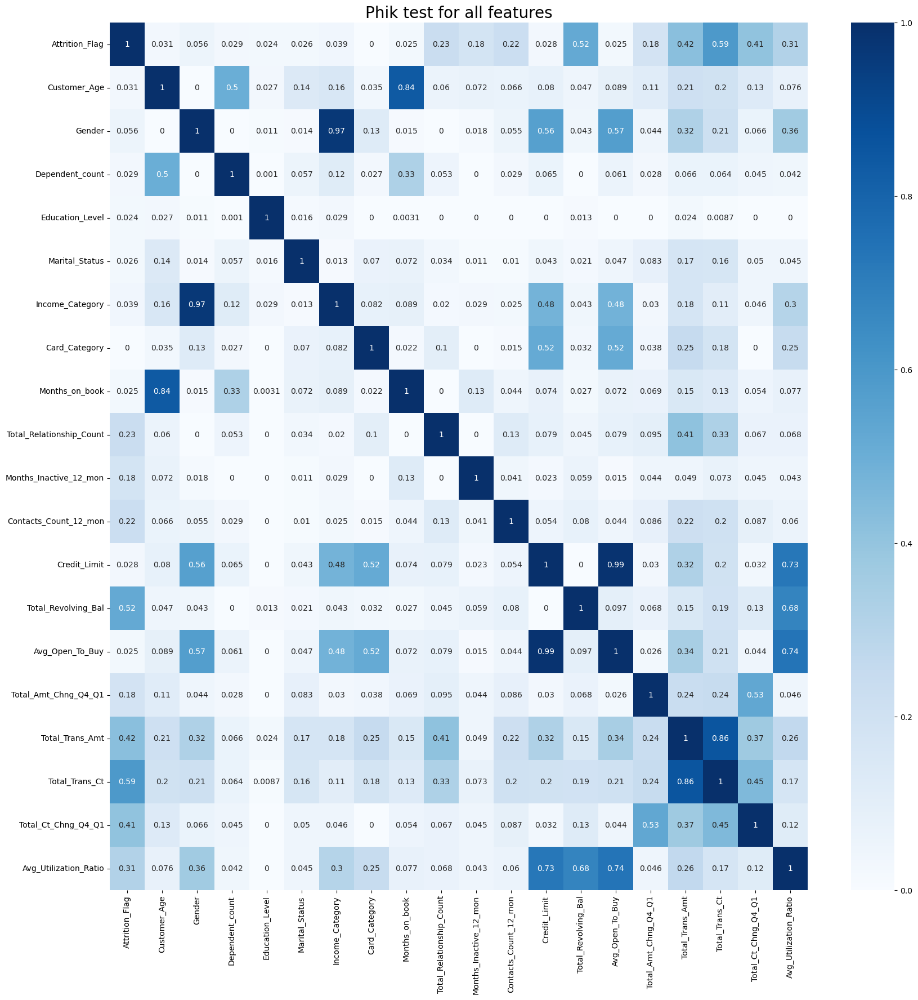

In [84]:
result = df.phik_matrix()

fig = plt.figure(figsize=(20,20))
sns.heatmap(result, annot=True, cmap='Blues')
plt.title('Phik test for all features', fontsize = 20)
plt.show()

interval columns not set, guessing: ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


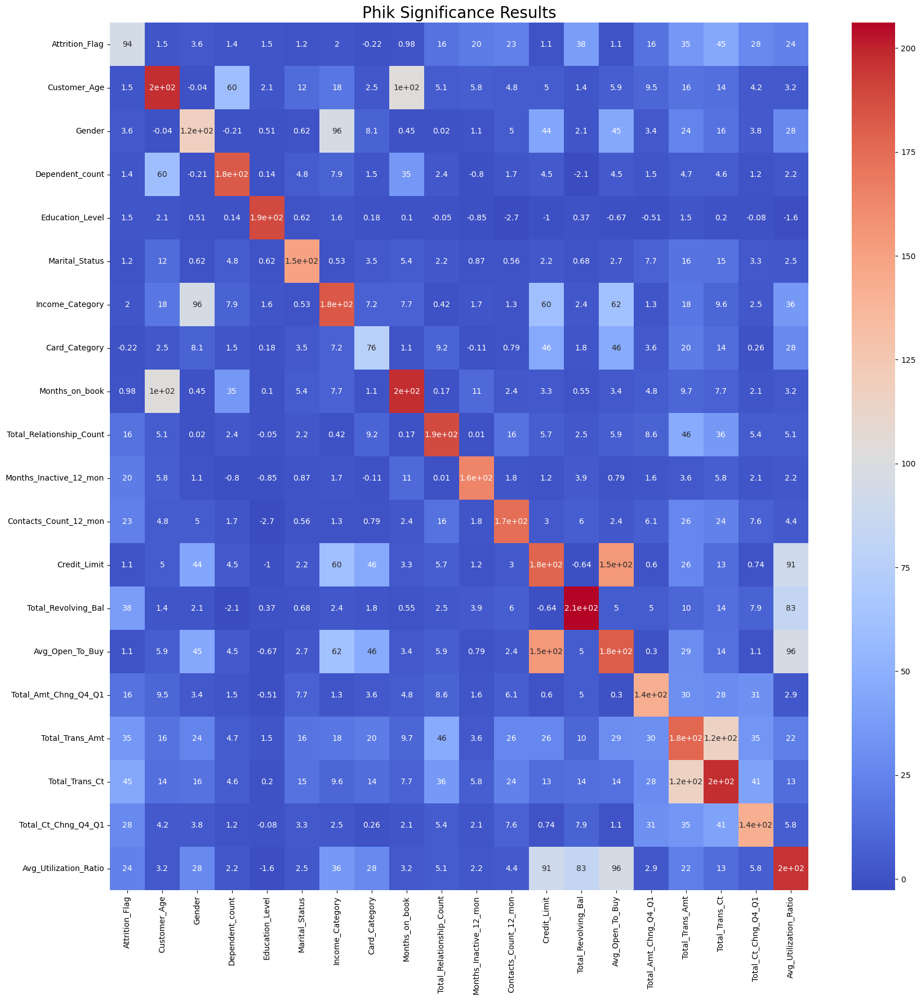

In [13]:
sig = df.significance_matrix()
fig = plt.figure(figsize=(20,20))
sns.heatmap(round(sig,2), annot=True, cmap='coolwarm')
plt.title('Phik Significance Results', fontsize = 20)
plt.show()

1. The high correlations of numeric features observed with Pearson's r are also shown in phiK analysis. 
2. 'Income_Category' and 'Gender' are highly correlated (phik 0.97). we can consider to drop one.

### <span style="color:red">Summary of feature engineering:</span>
### <span style="color:red">We are going to use phiK score of 0.9 as cutoff to drop correlated features from modeling:</span>
<span style="color:red">1. We will drop column Avg_Open_To_Buy since it correlates strongly with column Credit_Limit (phiK score 0.99); </span>
<br><span style="color:red">2. We will drop column Income_Category since it correlates strongly with column Gender (phiK score 0.97) and column Gender correlates better with label Attrition_Flag;</span>

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">8. DATA PREPROCESSING FOR CHURN PREDICTION</h1>

## In this section, we are going to prepare data ready for modeling churn prediction. We will use both feature engineering and feature selection to select best subset of features for modeling

### Reason for feature engineering: remove collinear features

Collinearity occurs when two or more predictors in a multiple regression model are highly correlated. This can cause problems with model interpretation because the predictors are not independent of each other, which can lead to unstable and inconsistent coefficients.

There are several reasons why it is important to identify and address collinearity in your model:

1. Collinearity can lead to unstable and inconsistent coefficients, making it difficult to interpret the importance of each predictor in the model.

2. Collinearity can inflate the standard errors of the coefficients, making it difficult to determine whether the coefficients are significantly different from zero.

3. Collinearity can reduce the power of statistical tests, making it harder to detect significant relationships in the data.

4. Collinearity can make it difficult to identify the underlying relationships in the data, which can lead to incorrect conclusions being drawn from the model.

In general, it is important to identify and address collinearity in your model to ensure that your results are reliable and interpretable.

### 7 reasons why we need feature selection:
(https://neptune.ai/blog/feature-selection-methods)

1. Irrelevant and redundant features
2. Curse of dimensionality
3. Training time
4. Deployment effort
5. Interpretability
6. Occam’s Razor
7. Data-model compatibility

# <span style="color:magenta">8.1 Feature engineering

In [164]:
df = pd.read_csv('BankChurners.csv')

In [165]:
df = df.drop(columns = ['CLIENTNUM',
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1', 
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'])

Text(0.5, 1.0, 'Pearson correlation bewteen numerical features')

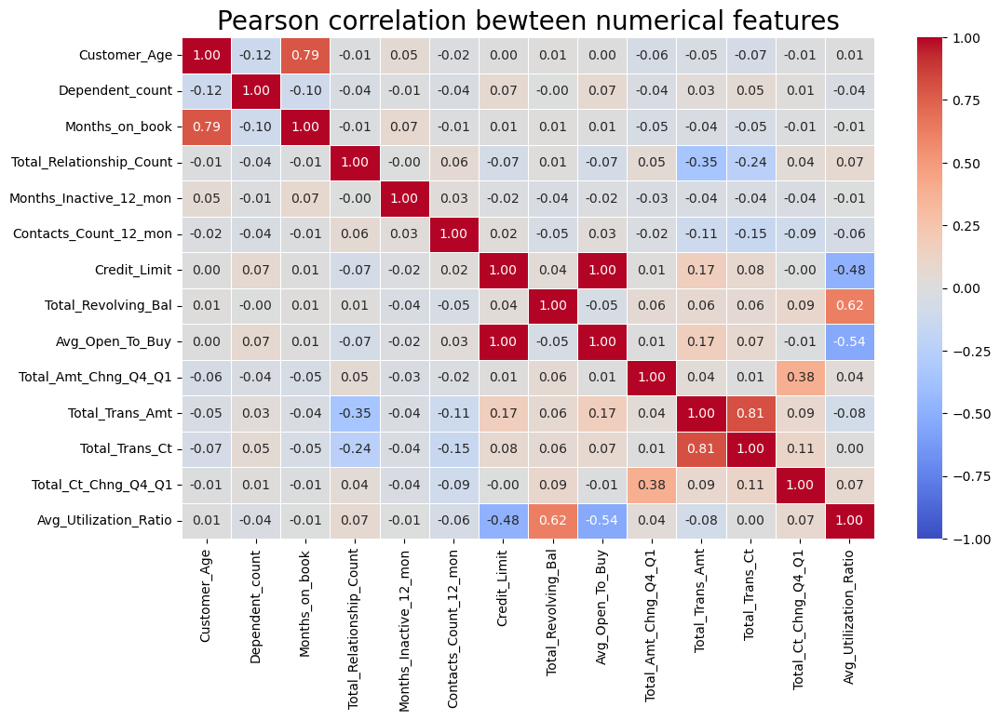

In [17]:
## Relationship between 2 numeric variables
plt.figure(figsize=(12,7))
sns.heatmap(df[num_col].corr(), 
            vmin=-1.0, 
            vmax=1.0, 
            linewidths=0.5, 
            cmap='coolwarm', 
            annot=True, 
            fmt='.2f')
plt.title('Pearson correlation bewteen numerical features', fontsize=20)

### To calculate the variance inflation factor (VIF) using Python, you can use the vif function from the statsmodels library. The vif function takes a fitted linear model, such as a linear regression, and a specific independent variable and returns the VIF score for that variable. 

In [33]:
df.Attrition_Flag.value_counts()

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64

In [36]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
sd = StandardScaler()

In [37]:
X_vif = pd.DataFrame(sd.fit_transform(df[num_col]), columns=[num_col])
y_vif = df['Attrition_Flag'].apply(lambda x: 1 if x == 'Attrited Customer' else 0)

In [38]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# fit a linear regression model
model = sm.OLS(y_vif, X_vif).fit()

# calculate the VIF for all independent variables
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
vif["features"] = X_vif.columns

print(vif)

    VIF Factor                     features
0     2.675596              (Customer_Age,)
1     1.028368           (Dependent_count,)
2     2.658294            (Months_on_book,)
3     1.155622  (Total_Relationship_Count,)
4     1.011021    (Months_Inactive_12_mon,)
5     1.037138     (Contacts_Count_12_mon,)
6          inf              (Credit_Limit,)
7          inf       (Total_Revolving_Bal,)
8          inf           (Avg_Open_To_Buy,)
9     1.190325      (Total_Amt_Chng_Q4_Q1,)
10    3.262889           (Total_Trans_Amt,)
11    3.023299            (Total_Trans_Ct,)
12    1.207886       (Total_Ct_Chng_Q4_Q1,)
13    2.899765     (Avg_Utilization_Ratio,)


/Users/xiaofwu-m1/opt/anaconda3/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


### Insights from pearson correlation analysis of numerical features:
- **Total_Revolving_Bal = Credit_Limit - Avg_Open_To_Buy**
- **Avg_Utilization_Ratio = Total_Revolving_Bal  / credit limit**
- **Usually Total_Revolving_Bal is much smaller than Avg_Open_To_Buy. Thus Credit_Limit is close to Avg_Open_To_Buy in most columns. Correlation is 1.0 between them. We can drop Avg_Open_To_Buy column**
- **Customer_age correlates well with Months_On_Book (0.79)**
- **Total_Trans_Ct also well correlates with Total_Trans_Amt (0.81). This is also understandable.** 
- **Also correlates well are Total_Revolving_Bal and Ave_Utlization_Ratio.**

In [ ]:
We are going to remove 

In [39]:
df = df.drop(columns = ['Avg_Open_To_Buy'])

In [41]:
num_col2 = df.select_dtypes(['int64','float64']).columns.to_list()
num_col2

['Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

In [42]:
X_vif2 = pd.DataFrame(sd.fit_transform(df[num_col2]), columns=[num_col2])

In [43]:
# fit a linear regression model
model = sm.OLS(y_vif, X_vif2).fit()

# calculate the VIF for all independent variables
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_vif2.values, i) for i in range(X_vif2.shape[1])]
vif["features"] = X_vif2.columns

print(vif)

    VIF Factor                     features
0     2.675596              (Customer_Age,)
1     1.028368           (Dependent_count,)
2     2.658376            (Months_on_book,)
3     1.155622  (Total_Relationship_Count,)
4     1.011255    (Months_Inactive_12_mon,)
5     1.037201     (Contacts_Count_12_mon,)
6     1.764888              (Credit_Limit,)
7     2.227309       (Total_Revolving_Bal,)
8     1.192111      (Total_Amt_Chng_Q4_Q1,)
9     3.263320           (Total_Trans_Amt,)
10    3.024481            (Total_Trans_Ct,)
11    1.208277       (Total_Ct_Chng_Q4_Q1,)
12    2.900014     (Avg_Utilization_Ratio,)


Text(0.5, 1.0, 'Pearson correlation bewteen numerical features')

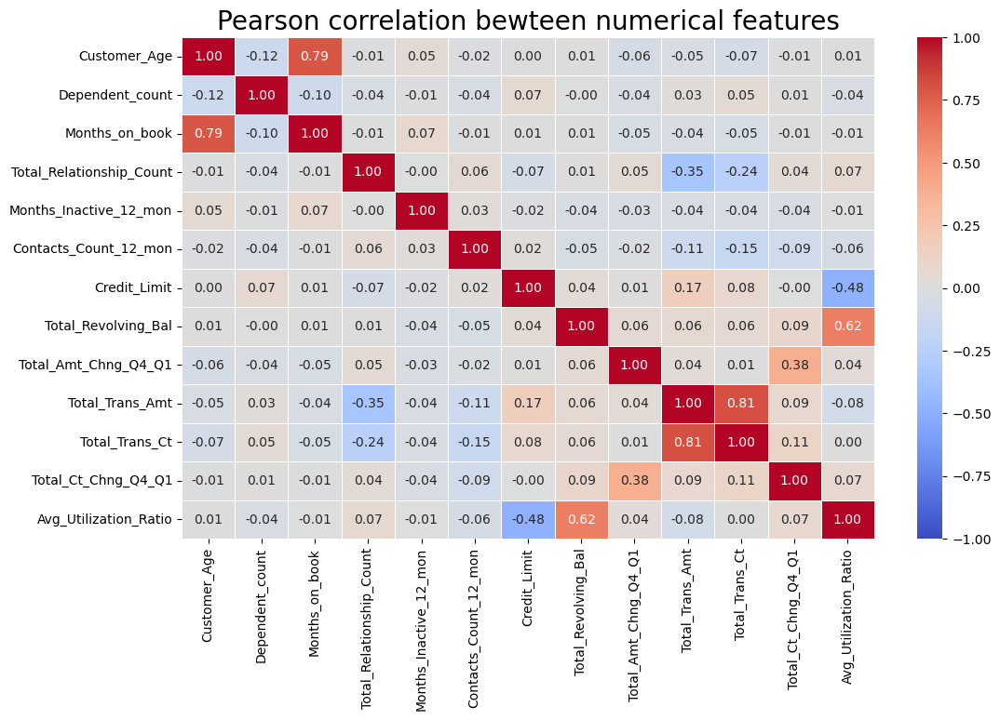

In [44]:
plt.figure(figsize=(12,7))
sns.heatmap(df[num_col2].corr(), 
            vmin=-1.0, 
            vmax=1.0, 
            linewidths=0.5, 
            cmap='coolwarm', 
            annot=True, 
            fmt='.2f')
plt.title('Pearson correlation bewteen numerical features', fontsize=20)

## Summary: Use VIF=4 or 5 as cutoff, we can only eliminate one feature: 'Avg_Open_To_Buy'

## Let's try to make a new feature using Total_trans_Amt / Total_trans_Ct

In [47]:
df['Cost_per_Buy'] = df['Total_Trans_Amt'] / df['Total_Trans_Ct']

In [55]:
num_col3 = df.select_dtypes(['int64','float64']).columns.to_list()
num_col3

['Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Cost_per_Buy']

Text(0.5, 1.0, 'Pearson correlation bewteen numerical features')

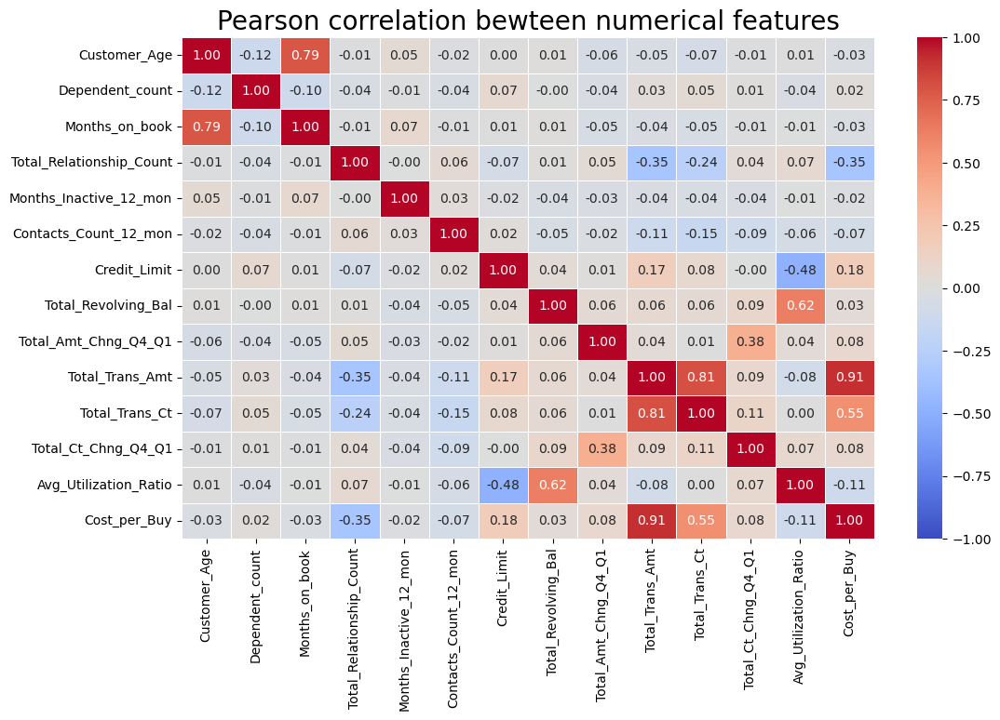

In [49]:
plt.figure(figsize=(12,7))
sns.heatmap(df[num_col3].corr(), 
            vmin=-1.0, 
            vmax=1.0, 
            linewidths=0.5, 
            cmap='coolwarm', 
            annot=True, 
            fmt='.2f')
plt.title('Pearson correlation bewteen numerical features', fontsize=20)

In [56]:
num_col4 = num_col3.remove('Total_Trans_Amt')

In [57]:
X_vif4 = pd.DataFrame(sd.fit_transform(df[num_col4]), columns=[num_col4])

KeyError: None

In [52]:
# fit a linear regression model
model = sm.OLS(y_vif, X_vif4).fit()
# calculate the VIF for all independent variables
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_vif3.values, i) for i in range(X_vif3.shape[1])]
vif["features"] = X_vif3.columns

print(vif)

    VIF Factor                     features
0     2.675695              (Customer_Age,)
1     1.030762           (Dependent_count,)
2     2.658538            (Months_on_book,)
3     1.158042  (Total_Relationship_Count,)
4     1.012719    (Months_Inactive_12_mon,)
5     1.037205     (Contacts_Count_12_mon,)
6     1.764921              (Credit_Limit,)
7     2.256974       (Total_Revolving_Bal,)
8     1.202853      (Total_Amt_Chng_Q4_Q1,)
9    28.944275           (Total_Trans_Amt,)
10    7.039422            (Total_Trans_Ct,)
11    1.211668       (Total_Ct_Chng_Q4_Q1,)
12    2.914519     (Avg_Utilization_Ratio,)
13   14.359484              (Cost_per_Buy,)


### From EDA in section 6 and above, we have a couple of features correlated strongly with each other. We are going to use phiK score of 0.9 as cutoff to drop correlated features from modeling analysis:
1. We will drop column Avg_Open_To_Buy since it correlates strongly with column Credit_Limit (phiK score 0.99); 
2. We will drop column Income_Category since it correlates strongly with column Gender (phiK score 0.97) and column Gender correlates better with label Attrition_Flag;

In [164]:
df = pd.read_csv('BankChurners.csv')

In [165]:
df = df.drop(columns = ['CLIENTNUM',
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1', 
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'])

interval columns not set, guessing: ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


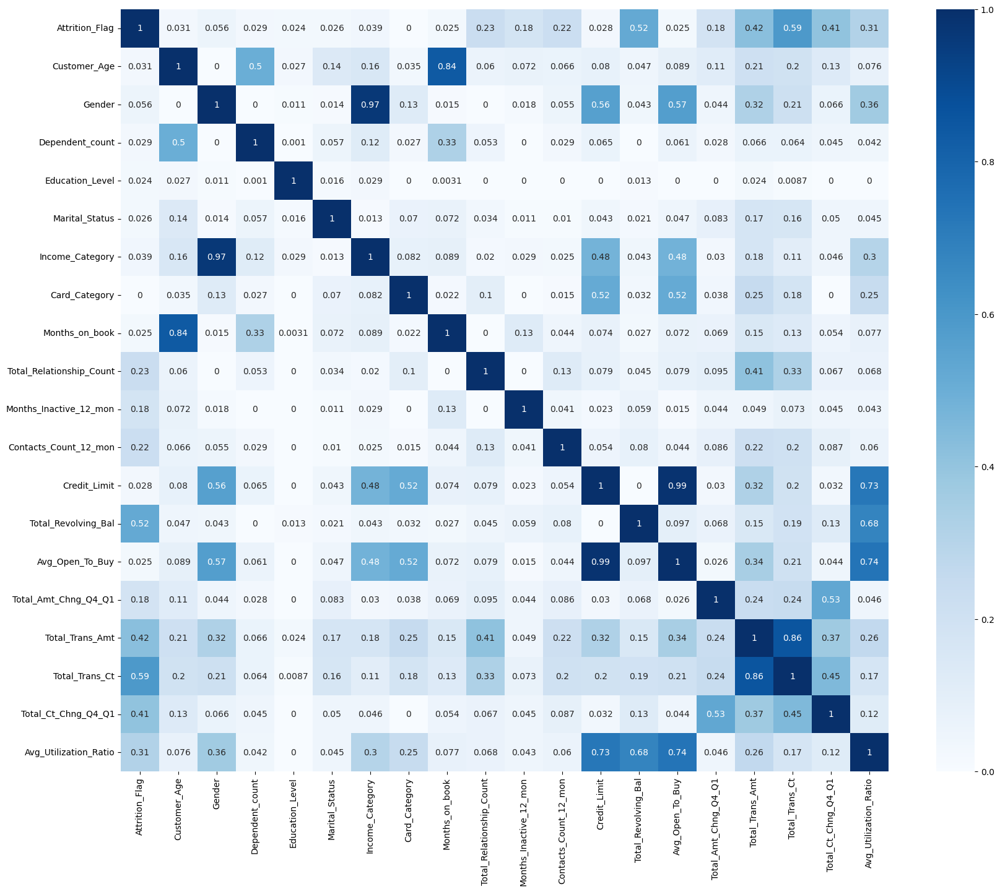

In [166]:
fig = plt.figure(figsize=(20,16))
sns.heatmap(df.phik_matrix(), annot=True, cmap='Blues')
plt.show()

In [167]:
df = df.drop(columns = ['Avg_Open_To_Buy', 'Income_Category'])

In [168]:
df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

# <span style="color:magenta">8.2 Feature selection
### <span style="color:magenta"> As mentioned above, we want to use feature selection to eliminate features not contributing much to the prediction of churn.    

## <span style="color:blue">8.2.1 Data processing

### From EDA, we know there is no missing values in the dataset. Howeever there are "Unknown" category in columns Education_Level and Marital_Status

In [169]:
print("Unique values in each categorical column:", '\n')
for col in df.select_dtypes(include=[object]):
    if(col != 'Attrition_Flag'):
         print(col,":", df[col].unique())

Unique values in each categorical column: 

Gender : ['M' 'F']
Education_Level : ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status : ['Married' 'Single' 'Unknown' 'Divorced']
Card_Category : ['Blue' 'Gold' 'Silver' 'Platinum']


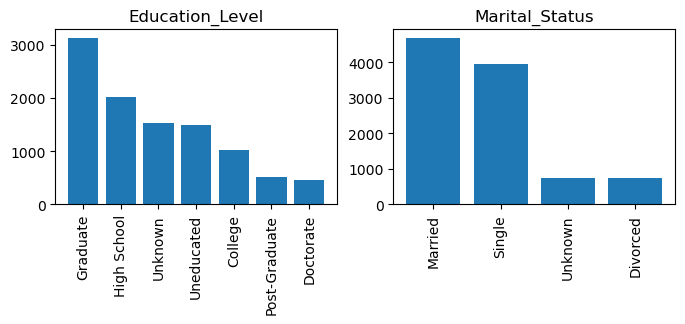

In [123]:
fig = plt.figure(figsize=(8, 5))
#fig.subplots_adjust(hspace=1.5, wspace=0.8)
for i,var in enumerate(['Education_Level', 'Marital_Status']):
    tmp = df[var].value_counts().reset_index()
    ax = fig.add_subplot(2, 2, i+1)
    ax.bar(tmp['index'], tmp[var])
    ax.set_title(var)
    ax.tick_params(axis='x', labelrotation = 90)

### Processing categorical columns:
1. We will use OneHot encoding for column Gender and Marital_Status since there is no obvious order between different groups in the column. We will leave unknown as a new group in column Marital_Status since we don't have a good way to guess its value.
2. We will use ordinal encoding for columns Education_Level and Card_Category since there is obvious order between different groups in each column. Unknown value in column Education_Level will also be treated as a seperate group since there is no dominant group in the column. It is probably not fair to fill it with mode. We can try it out.

In [170]:
def binary_encode(df, column, positive_value):
    df = df.copy()
    df[column] = df[column].apply(lambda x: 1 if x == positive_value else 0)
    return df

def ordinal_encode(df, column, ordering):
    df = df.copy()
    df[column] = df[column].apply(lambda x: ordering.index(x))
    return df

def onehot_encode(df, column, prefix):
    df = df.copy()
    dummies = pd.get_dummies(df[column], prefix=prefix)
    df = pd.concat([df, dummies], axis=1)
    df = df.drop(column, axis=1)
    return df

In [171]:
# Encode ordinal column Educational_Level
education_ordering = [
        'Unknown',
        'Uneducated',
        'High School',
        'College',
        'Graduate',
        'Post-Graduate',
        'Doctorate'
]

In [172]:
# Encode ordinal column Card_Category
card_ordering = [
        'Blue',
        'Silver',
        'Gold',
        'Platinum',
]

In [173]:
# Binary encoding columns: Attrition_Flag and Gender
df = binary_encode(df, 'Attrition_Flag', positive_value='Attrited Customer')
df = binary_encode(df, 'Gender', positive_value='M')

In [174]:
# Ordinal encoding columns: Educational_Level and Card_Category
df = ordinal_encode(df, 'Education_Level', ordering=education_ordering)
df = ordinal_encode(df, 'Card_Category', ordering=card_ordering)

In [175]:
# OneHot encode column Marital_Status
df = onehot_encode(df, 'Marital_Status', prefix='MS')

In [176]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,...,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,MS_Divorced,MS_Married,MS_Single,MS_Unknown
0,0,45,1,3,2,0,39,5,1,3,...,777,1.335,1144,42,1.625,0.061,0,1,0,0
1,0,49,0,5,4,0,44,6,1,2,...,864,1.541,1291,33,3.714,0.105,0,0,1,0
2,0,51,1,3,4,0,36,4,1,0,...,0,2.594,1887,20,2.333,0.000,0,1,0,0
3,0,40,0,4,2,0,34,3,4,1,...,2517,1.405,1171,20,2.333,0.760,0,0,0,1
4,0,40,1,3,1,0,21,5,1,0,...,0,2.175,816,28,2.500,0.000,0,1,0,0


In [177]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  int64  
 5   Card_Category             10127 non-null  int64  
 6   Months_on_book            10127 non-null  int64  
 7   Total_Relationship_Count  10127 non-null  int64  
 8   Months_Inactive_12_mon    10127 non-null  int64  
 9   Contacts_Count_12_mon     10127 non-null  int64  
 10  Credit_Limit              10127 non-null  float64
 11  Total_Revolving_Bal       10127 non-null  int64  
 12  Total_Amt_Chng_Q4_Q1      10127 non-null  float64
 13  Total_Trans_Amt           10127 non-null  int64  
 14  Total_

## <span style="color:blue">8.2.2 Split df into X and y

In [178]:
y = df['Attrition_Flag']
X = df.drop('Attrition_Flag', axis=1)

## <span style="color:blue">8.2.3 Feature selection 

In general, it is a good idea to try out multiple feature selection methods and compare their performance on your specific data and problem to determine which one works best. Some common feature selection methods include:

1. **Filter methods:** These methods work by ranking features based on a statistical measure of their importance, and then selecting a subset of the most important features. Examples of filter methods include mutual information and chi-squared statistics.

2. **Wrapper methods:** These methods use one or more base models as building blocks to create a more complex model, and use the model performance to determine the feature importance. Examples of wrapper methods include recursive feature elimination (RFE) and forward feature selection.

3. **Embedded methods:** These methods learn the feature importance as part of the model training process. Examples of embedded methods include Lasso and random forests.

It is always a good idea to try out multiple feature selection methods and compare their performance to determine which one works best for your specific problem. In addition to the methods mentioned above, there are also other feature selection methods that may be suitable for certain problems, such as genetic algorithms and neural networks.

<div>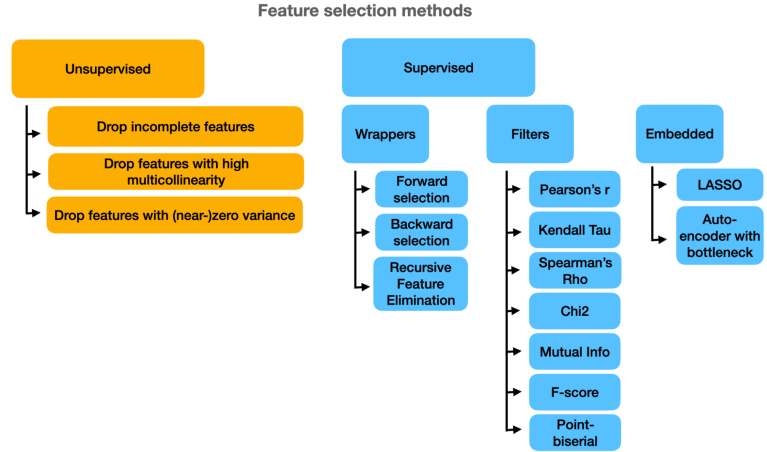</div> 

### First, let start with Variance threshold tp remove low variance features - unsupervised method. Features with low variance can be dropped since they will not contribute much to label prediction.

In [214]:
# We need to normalize X first
from sklearn.preprocessing import StandardScaler
sd = StandardScaler()
X = pd.DataFrame(sd.fit_transform(X), columns=X.columns)

In [215]:
X.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,MS_Divorced,MS_Married,MS_Single,MS_Unknown
0,-0.165406,1.059956,0.503368,-0.354022,-0.250587,0.384621,0.763943,-1.327136,0.492404,0.446622,-0.473422,2.623494,-0.959707,-0.973895,3.834003,-0.775882,-0.282405,1.077338,-0.798507,-0.282609
1,0.333570,-0.943436,2.043199,0.822218,-0.250587,1.010715,1.407306,-1.327136,-0.411616,-0.041367,-0.366667,3.563293,-0.916433,-1.357340,12.608573,-0.616276,-0.282405,-0.928214,1.252337,-0.282609
2,0.583058,1.059956,0.503368,0.822218,-0.250587,0.008965,0.120579,-1.327136,-2.219655,-0.573698,-1.426858,8.367214,-0.740982,-1.911206,6.807864,-0.997155,-0.282405,1.077338,-0.798507,-0.282609
3,-0.789126,-0.943436,1.273283,-0.354022,-0.250587,-0.241473,-0.522785,1.641478,-1.315636,-0.585251,1.661686,2.942843,-0.951758,-1.911206,6.807864,1.759686,-0.282405,-0.928214,-0.798507,3.538459
4,-0.789126,1.059956,0.503368,-0.942142,-0.250587,-1.869317,0.763943,-1.327136,-2.219655,-0.430877,-1.426858,6.455682,-1.056263,-1.570365,7.509325,-0.997155,-0.282405,1.077338,-0.798507,-0.282609


In [216]:
X.columns, len(X.columns)

(Index(['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level',
        'Card_Category', 'Months_on_book', 'Total_Relationship_Count',
        'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
        'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
        'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
        'MS_Divorced', 'MS_Married', 'MS_Single', 'MS_Unknown'],
       dtype='object'),
 20)

In [226]:
from sklearn.feature_selection import VarianceThreshold
# Create a VarianceThreshold feature selector with a threshold of 0.1
sel = VarianceThreshold(threshold=0.5)
sel.fit(X)

VarianceThreshold(threshold=0.5)

In [227]:
len(sel.get_feature_names_out())

20

In [229]:
sel.get_feature_names_out(), len(sel.get_feature_names_out())

(array(['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level',
        'Card_Category', 'Months_on_book', 'Total_Relationship_Count',
        'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
        'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
        'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
        'MS_Divorced', 'MS_Married', 'MS_Single', 'MS_Unknown'],
       dtype=object),
 20)

### We can not eliminate any feature even we set threshold as 0.5. This suggests data in all columns are quite spread out, i.e. high variance.

### Next I will try wrapper methods - SelectKBest and Recursive Feature Elimination with Cross-Validation (RFECV). I will compare which method works better on this dataset

In [234]:
# f_classif:  ANOVA F-value between label/feature for classification tasks.
from sklearn.feature_selection import SelectKBest, f_classif 
sel = SelectKBest(f_classif, k=12)
sel.fit(X, y)

SelectKBest(k=12)

In [236]:
mask_sk = sel.get_feature_names_out()
mask_sk

array(['Gender', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'MS_Married'],
      dtype=object)

In [207]:
# let's check the p-value of each features
df_scores = pd.DataFrame({'feature': X.columns, 'score': sel.scores_, 
                          'p_value': sel.pvalues_})
df_scores.sort_values(by='p_value', ascending=True)

,feature,score,p_value
13,Total_Trans_Ct,1620.121692,0.000000e+00
14,Total_Ct_Chng_Q4_Q1,930.078416,1.647725e-195
10,Total_Revolving_Bal,752.702408,6.630148e-160
8,Contacts_Count_12_mon,441.868050,4.697490e-96
15,Avg_Utilization_Ratio,332.876795,3.357689e-73
12,Total_Trans_Amt,296.227714,1.857439e-65
7,Months_Inactive_12_mon,240.910376,1.032664e-53
6,Total_Relationship_Count,233.072886,4.829281e-52
11,Total_Amt_Chng_Q4_Q1,176.961638,4.836643e-40
1,Gender,14.085007,1.757076e-04


### If we we p<0.05 as cutoff, we end up with 12 features. Most of them are numerical features. This is consistent with our EDA analysis which shows most categorical columns do not contribute to churn prediction.

### Recursive Feature Elimination with Cross-Validation (RFECV) is a method for selecting a subset of features for a machine learning model by recursively eliminating features and evaluating the performance of the model on a cross-validated dataset. 

In [52]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

In [258]:
# first try to use baseline RF to select features
import time
start = time.time()

rf = RandomForestClassifier(random_state=2022)
rfecv = RFECV(estimator=rf, cv=5)
rfecv.fit(X, y)

end = time.time() 
print(f'This session took {(end - start) / 60} minutes.')

This session took 1.8695463498433431 minutes.


In [259]:
print("Feature ranking: ", rfecv.ranking_)

Feature ranking:  [1 4 2 3 7 1 1 1 1 1 1 1 1 1 1 1 9 5 6 8]


In [260]:
mask_rfe = rfecv.get_support()
features = X.columns
best_features = features[mask_rfe]
 
print("All features: ", X.shape[1])
print(features)

print("Selected best: ", best_features.shape[0])
print(features[mask_rfe]) 

All features:  20
Index(['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level',
       'Card_Category', 'Months_on_book', 'Total_Relationship_Count',
       'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'MS_Divorced', 'MS_Married', 'MS_Single', 'MS_Unknown'],
      dtype='object')
Selected best:  12
Index(['Customer_Age', 'Months_on_book', 'Total_Relationship_Count',
       'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')


### RFECV with RF eliminated 8 features. Most of them are originally categorical columns. This is consistent with our EDA analysis. Next, I will add class_weight = balanced to RF to repeat RFECV. See if we get differrent result.

In [261]:
# set class_weight='balanced' for RF
import time
start = time.time()
rf_cw = RandomForestClassifier(class_weight='balanced', random_state=2022)
rfecv_cw = RFECV(estimator=rf_cw, cv=5)
rfecv_cw.fit(X, y)

end = time.time() 
print(f'This session took {(end - start) / 60} minutes.')

This session took 1.742808214823405 minutes.


In [262]:
print("Feature ranking: ", rfecv_cw.ranking_)

Feature ranking:  [1 4 3 2 7 1 1 1 1 1 1 1 1 1 1 1 9 5 6 8]


In [263]:
mask_rfecw = rfecv_cw.get_support()
features = X.columns
best_features = features[mask_rfecw]
 
print("All features: ", X.shape[1])
print(features)

print("Selected best: ", best_features.shape[0])
print(features[mask_rfecw]) 

All features:  20
Index(['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level',
       'Card_Category', 'Months_on_book', 'Total_Relationship_Count',
       'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'MS_Divorced', 'MS_Married', 'MS_Single', 'MS_Unknown'],
      dtype='object')
Selected best:  12
Index(['Customer_Age', 'Months_on_book', 'Total_Relationship_Count',
       'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')


### We got the same result with or without class_weight='balanced'

# <span style="color:magenta">8.3 SMOTE
### <span style="color:magenta"> The aim is to balance the data. Need to compare class_weight, SMOTE, maybe downsampling and ensemble method if I have time

In [264]:
y.value_counts()

0    8500
1    1627
Name: Attrition_Flag, dtype: int64

## <span style="color:blue">8.3.1 Set up features for modeling

In [266]:
#Saving dataframe with selected features
X_rfe = X.iloc[:, rfecv.support_]

#Overview of the optimal features in comparison with the intial dataframe
print("X dimension: {}".format(X.shape))
print("X column list:", X.columns.tolist())
print()
print("X_rfe dimension: {}".format(X_rfe.shape))
print("X_rfe column list:", X_rfe.columns.tolist())

X dimension: (10127, 20)
X column list: ['Customer_Age', 'Gender', 'Dependent_count', 'Education_Level', 'Card_Category', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'MS_Divorced', 'MS_Married', 'MS_Single', 'MS_Unknown']

X_rfe dimension: (10127, 12)
X_rfe column list: ['Customer_Age', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


## <span style="color:blue">8.3.2 train_test_split
### We should upsample only the training set, not the test set. So let's first perform train_test_split

In [265]:
from sklearn.model_selection import train_test_split

In [267]:
X_train, X_test, y_train, y_test = train_test_split(X_rfe, y, test_size = 0.2, 
                                                    stratify = y, random_state=42)

## <span style="color:blue">8.3.3 Apply SMOTE

Our data is imbalanced. There are currently two popular methods for sampling minority categories:

1. Synthetic Minority Oversampling Technique (SMOTE).
    - An improved algorithm of SOMTE is used here: BoderlineSMOTE.
    - SMOTE: For the minority sample A, randomly select a nearest neighbor sample B, and then randomly select a point C from the line between A and B as the new minority sample.
    - BoderlineSMOTE: All minority sample points are divided into three categories: 1) noise, that is, all nearby points are heterogeneous samples. 2) In danger, at least half of the nearby points are samples of the same kind. 3) Safe points, all nearby points are samples of the same kind. Then uniformly use the second-class in danger minority samples to generate data points.
2. Adaptive Synthetic (ADASYN).

In [271]:
# SMOTE works better than BoderlineSMOTE for our dataset
import imblearn
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE

In [272]:
bsm = BorderlineSMOTE(k_neighbors=5, m_neighbors=10, random_state=42)
X_train_bsm, y_train_bsm = bsm.fit_resample(X_train, y_train)
sm = SMOTE(k_neighbors=5, random_state=42)
X_train_sm, y_train_sm = sm.fit_resample(X_train, y_train)

In [273]:
#Check the result of SMOTE
from collections import Counter
print(Counter(y_train))
print(Counter(y_train_sm))
print(Counter(y_train_bsm))

Counter({0: 6799, 1: 1302})
Counter({0: 6799, 1: 6799})
Counter({0: 6799, 1: 6799})


### Now we have X_train_sm, y_train_sm, X_test, y_test ready for modeling

In [274]:
X_train_sm

,Customer_Age,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,-1.288101,-1.493661,0.120579,0.651940,-0.411616,-0.667004,1.309516,-0.337327,-0.779840,-0.973895,-1.109831,2.151448
1,-0.290150,0.008965,0.763943,-0.337598,0.492404,1.831365,-1.426858,0.406300,-0.624701,-1.144315,-0.542782,-0.997155
2,-0.040662,-0.742348,1.407306,0.651940,-1.315636,0.334280,-0.304086,0.602472,-0.037412,1.028541,0.595518,-0.714216
3,-1.288101,-1.493661,-0.522785,-1.327136,0.492404,-0.606047,0.527870,0.497543,-0.810161,-1.016500,-1.450061,0.852830
4,0.458314,0.509840,0.120579,-0.337598,0.492404,2.848054,0.027224,-0.159404,-0.156047,0.304255,0.007467,-0.873823
...,...,...,...,...,...,...,...,...,...,...,...,...
13593,-0.503936,-0.313148,0.120579,0.651940,0.492404,-0.672225,1.465822,-0.542961,-0.536494,-1.171715,-0.472549,2.398344
13594,-1.554266,-1.720159,-1.235817,-0.337598,1.396424,2.109203,-1.426858,-1.456469,-1.010552,-1.867233,1.046389,-0.997155
13595,1.298761,0.008965,-1.166148,0.651940,1.015942,2.472224,-1.426858,-0.891036,-0.836978,-1.034432,-1.609748,-0.997155
13596,1.150118,1.226981,-1.166148,-0.607638,0.492404,-0.791527,-1.426858,1.262735,-1.005665,-1.798761,1.791189,-0.997155


<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">9. Churn Modeling</h1>

# <span style="color:magenta">9.1 Model selection

In [275]:
# Models
from sklearn.model_selection import KFold,RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import xgboost as xgb
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier,AdaBoostClassifier

In [278]:
#Metrics
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import (
    auc,
    roc_curve,
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
)

In [276]:
def report_loss_cf(name, model, X_train, y_train, X_test, y_test, graph=0):
    
    print('Model performance for: ', name)
    
    def calculate_loss(model, X, y):
        pred = model.predict(X)
        pred_proba = model.predict_proba(X)

        accuracy = accuracy_score(y, pred)
        precision = precision_score(y, pred)
        recall = recall_score(y, pred)
        f1 = f1_score(y, pred)
        auc = roc_auc_score(y, pred_proba[:,1])
        fpr, tpr, _ = roc_curve(y, pred_proba[:,1])
        return pred, accuracy, precision, recall, f1, auc, fpr, tpr
    
    y_train_pred, accuracy_train, precision_train, recall_train, f1_train, auc_train, fpr_train, tpr_train = calculate_loss(
        model, X_train, y_train)
    print(f'train set accuracy: {accuracy_train:.3f}')
    print(f'train set precision: {precision_train:.3f}')
    print(f'train set recall: {recall_train:.3f}')
    print(f'train set f1 score: {f1_train:.3f}')
    print(f'training set AUC score: {auc_train:.3f}')
    print()
    
    y_test_pred, accuracy_test, precision_test, recall_test, f1_test, auc_test, fpr_test, tpr_test = calculate_loss(
        model, X_test, y_test)
    print(f'test set accuracy: {accuracy_test:.3f}')
    print(f'test set precision: {precision_test:.3f}')
    print(f'test set recall: {recall_test:.3f}')
    print(f'test set f1 score: {f1_test:.3f}')
    print(f'test set AUC score: {auc_test:.3f}')

    if graph == 0:
        return 

    elif graph == 1:
        
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(7, 3))
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        sns.heatmap(cm_train, annot=True, cmap="Blues", fmt='g', ax=ax1)
        ax1.set_title('train set')
        ax1.set_xlabel('Predicted labl')
        ax1.set_ylabel('True label')
        ax1.xaxis.set_ticklabels(['Customer', 'Churner'])
        ax1.yaxis.set_ticklabels(['Customer', 'Churner'])
        
        sns.heatmap(cm_test, annot=True, cmap="Blues", fmt='g', ax=ax2)
        ax2.set_title('test set')
        ax2.set_xlabel('Predicted labl')
        ax2.set_ylabel('True label')
        ax2.xaxis.set_ticklabels(['Customer', 'Churner'])
        ax2.yaxis.set_ticklabels(['Customer', 'Churner'])
        plt.tight_layout()
        plt.show()
        
    elif graph == 2:   
        
        plt.figure(figsize=(5,3))
        plt.plot([0,1], [0,1], linestyle='--', label='random')
        plt.plot(fpr_train, tpr_train,label="Train_AUC="+str(auc_train.round(3)))
        plt.plot(fpr_test,tpr_test,label="Test_AUC="+str(auc_test.round(3)))
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(loc=4)
        plt.tight_layout()
        plt.show()

In [277]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train_sm, X_test, y_train_sm, y_test)

print(models)

 90%|████████████████████████████████████████████████████████▍      | 26/29 [00:30<00:02,  1.02it/s]

[22:01:23] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|███████████████████████████████████████████████████████████████| 29/29 [00:31<00:00,  1.09s/it]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
XGBClassifier                      0.96               0.93     0.93      0.96   
LGBMClassifier                     0.96               0.93     0.93      0.96   
RandomForestClassifier             0.96               0.92     0.92      0.96   
AdaBoostClassifier                 0.94               0.92     0.92      0.94   
ExtraTreesClassifier               0.95               0.90     0.90      0.95   
SVC                                0.92               0.89     0.89      0.92   
BaggingClassifier                  0.94               0.89     0.89      0.94   
KNeighborsClassifier               0.90               0.88     0.88      0.90   
DecisionTreeClassifier             0.92               0.87     0.87      0.92   
QuadraticDiscriminantAnalysis      0.88               0.85     0.85      0.88   
NuSVC                       

## Result from Lazypredict suggests XGBoost and LightGBM work the best. But they both overfit. Since we claim to focus on recall, I will check recall score of several top models.

In [ ]:
X_train_sm, X_test, y_train_sm, y_test

In [282]:
models = []  

# Appending models into the list with default parameters and random_state=2022
models.append(("LogisticRegression", LogisticRegression(random_state=2022)))
models.append(("RandomForest", RandomForestClassifier(random_state=2022)))
models.append(("GBM", GradientBoostingClassifier(random_state=2022)))
models.append(("XGBoost",  XGBClassifier(random_state=2022)))
models.append(("LightGBM", LGBMClassifier(random_state=2022)))

print("\n" "Training set Recall score:" "\n")

for name, model in models:
    model.fit(X_train_sm, y_train_sm)
    scores = recall_score(y_train_sm, model.predict(X_train_sm)) 
    print("{}: {}".format(name, scores))
    
print("\n" "Test set Recall and AUC scores:" "\n")
for name, model in models:
    y_pred =model.predict(X_test)
    scores = recall_score(y_test, y_pred) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)  
    print("{}: {}\t{}".format(name, scores, metrics.auc(fpr, tpr)))


Training set Recall score:

LogisticRegression: 0.8674805118399764
RandomForest: 1.0
GBM: 0.9791145756728931
[22:28:04] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost: 1.0
LightGBM: 0.999264597734961

Test set Recall and AUC scores:

LogisticRegression: 0.8	0.8306290417401528
RandomForest: 0.8707692307692307	0.9203934337267671
GBM: 0.8923076923076924	0.931456609234387
XGBoost: 0.88	0.9302998236331569
LightGBM: 0.8861538461538462	0.9336706914484693


## Logistic Regression

Model performance for:  LogisticRegression
train set accuracy: 0.856
train set precision: 0.849
train set recall: 0.867
train set f1 score: 0.858
training set AUC score: 0.930

test set accuracy: 0.851
test set precision: 0.524
test set recall: 0.800
test set f1 score: 0.633
test set AUC score: 0.918


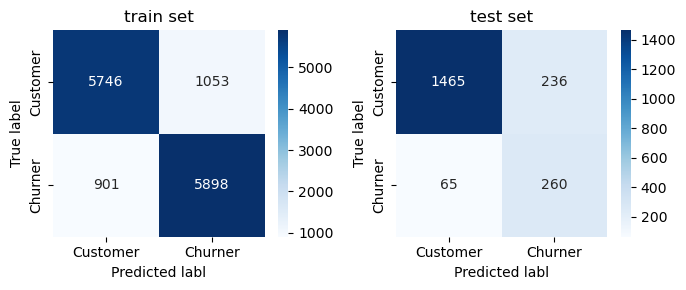

In [285]:
lg = LogisticRegression(random_state=2022)
model_lg = lg.fit(X_train_sm, y_train_sm)
report_loss_cf('LogisticRegression', model_lg, X_train_sm, y_train_sm, X_test, y_test, graph=1)

## Random Forest

Model performance for:  GBM
train set accuracy: 1.000
train set precision: 1.000
train set recall: 1.000
train set f1 score: 1.000
training set AUC score: 1.000

test set accuracy: 0.954
test set precision: 0.847
test set recall: 0.871
test set f1 score: 0.859
test set AUC score: 0.984


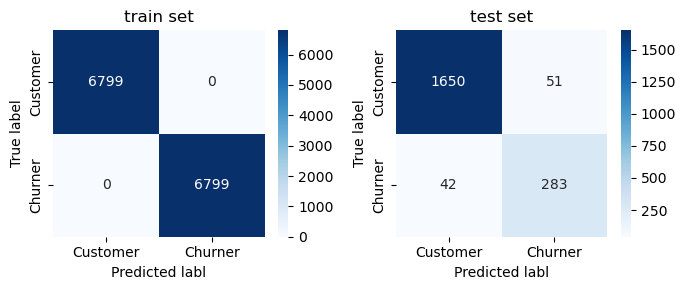

In [287]:
rf = RandomForestClassifier(random_state=2022)
model_rf = rf.fit(X_train_sm, y_train_sm)
report_loss_cf('GBM', model_rf, X_train_sm, y_train_sm, X_test, y_test, graph=1)

## GBM

Model performance for:  GBM
train set accuracy: 0.974
train set precision: 0.970
train set recall: 0.979
train set f1 score: 0.974
training set AUC score: 0.997

test set accuracy: 0.958
test set precision: 0.853
test set recall: 0.892
test set f1 score: 0.872
test set AUC score: 0.987


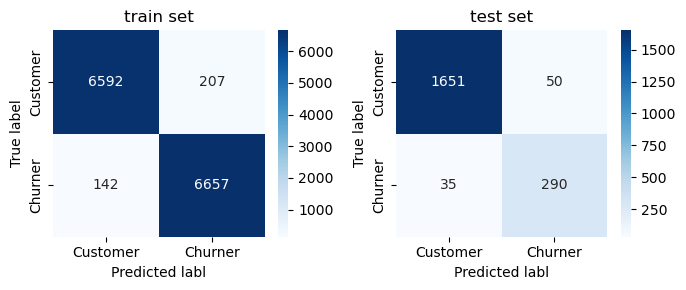

In [286]:
gbm = GradientBoostingClassifier(random_state=2022)
model_gbm = gbm.fit(X_train_sm, y_train_sm)
report_loss_cf('GBM', model_gbm, X_train_sm, y_train_sm, X_test, y_test, graph=1)

## LightGBM

Model performance for:  LightGBMClassifier
train set accuracy: 0.999
train set precision: 0.998
train set recall: 0.999
train set f1 score: 0.999
training set AUC score: 1.000

test set accuracy: 0.966
test set precision: 0.900
test set recall: 0.886
test set f1 score: 0.893
test set AUC score: 0.991


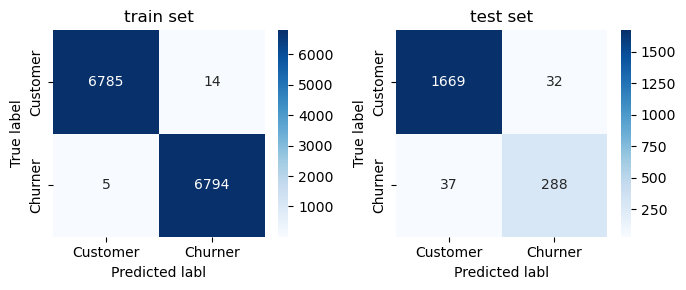

In [283]:
light = LGBMClassifier(objective='binary', random_state=2022)
model_light = light.fit(X_train_sm, y_train_sm)
report_loss_cf('LightGBMClassifier', model_light, X_train_sm, y_train_sm, X_test, y_test, graph=1)

## XGBoost

[22:30:00] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Model performance for:  XGBClassifier
train set accuracy: 1.000
train set precision: 1.000
train set recall: 1.000
train set f1 score: 1.000
training set AUC score: 1.000

test set accuracy: 0.964
test set precision: 0.897
test set recall: 0.880
test set f1 score: 0.888
test set AUC score: 0.990


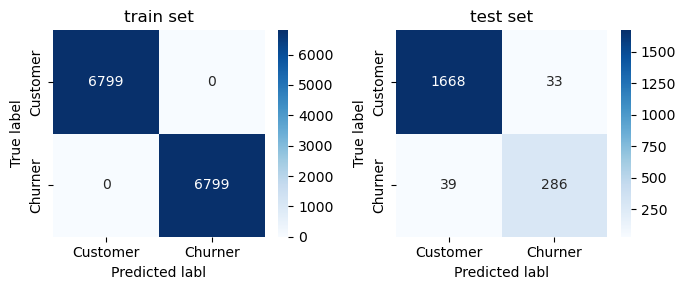

In [284]:
xgbc=XGBClassifier(random_state=2022)
model_xgb = xgbc.fit(X_train_sm, y_train_sm)
report_loss_cf('XGBClassifier', model_xgb, X_train_sm, y_train_sm, X_test, y_test, graph=1)

# <span style="color:magenta">9.2 Model tunning

## By cmparing several models, GBM is the best in terms of best test set score and a little bit better overfitting than RF, XGBoost and LightGBM.

# Need Tune GBM...

Model performance for:  GBM
train set accuracy: 0.974
train set precision: 0.970
train set recall: 0.979
train set f1 score: 0.974
training set AUC score: 0.997

test set accuracy: 0.958
test set precision: 0.853
test set recall: 0.892
test set f1 score: 0.872
test set AUC score: 0.987


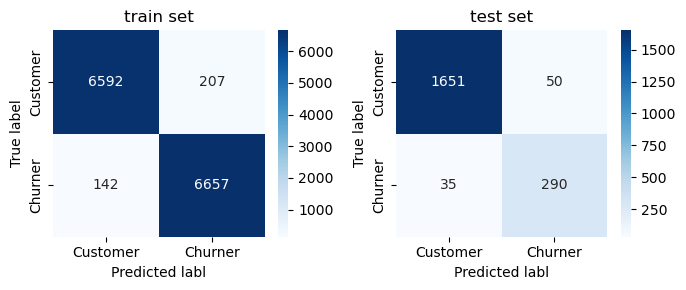

In [289]:
gbm = GradientBoostingClassifier(random_state=2022)
model_gbm = gbm.fit(X_train_sm, y_train_sm)
report_loss_cf('GBM', model_gbm, X_train_sm, y_train_sm, X_test, y_test, graph=1)

Model performance for:  GBM
train set accuracy: 0.974
train set precision: 0.970
train set recall: 0.979
train set f1 score: 0.974
training set AUC score: 0.997

test set accuracy: 0.958
test set precision: 0.853
test set recall: 0.892
test set f1 score: 0.872
test set AUC score: 0.987


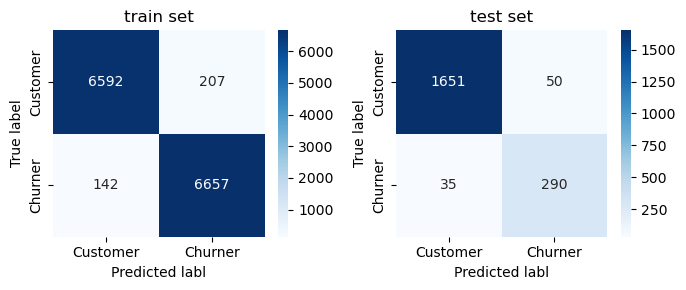

In [290]:
report_loss_cf('GBM', model_gbm, X_train_sm, y_train_sm, X_test, y_test, graph=1)

### plot the feature inportance

In [291]:
feat_importance = model_gbm.feature_importances_
df_feat_importance = pd.DataFrame(feat_importance,columns=['Score'],index=X_train_sm.columns)
df_feat_importance.sort_values(by='Score',ascending=False).style.background_gradient(cmap='OrRd')

,Score
Total_Trans_Ct,0.488641
Total_Trans_Amt,0.147484
Total_Revolving_Bal,0.124582
Total_Relationship_Count,0.086567
Total_Ct_Chng_Q4_Q1,0.056398
Months_Inactive_12_mon,0.036272
Total_Amt_Chng_Q4_Q1,0.022694
Contacts_Count_12_mon,0.022681
Customer_Age,0.010634
Months_on_book,0.003298


<AxesSubplot:xlabel='Score'>

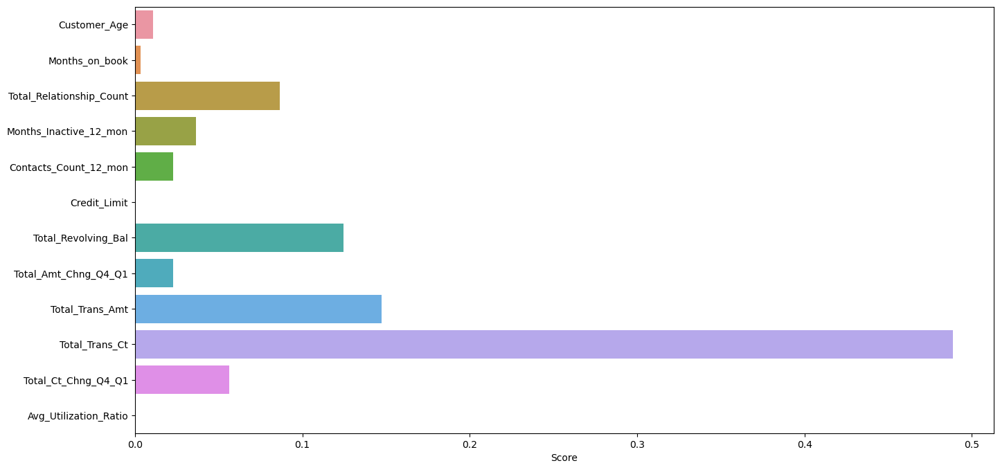

In [292]:
plt.figure(figsize=(16,8))
#plt.title('Feature Importances')
sns.barplot(x=df_feat_importance.Score,y=df_feat_importance.index)

# <span style="color:magenta">9.3 SHAP

SHAP (SHapley Additive exPlanations) is a unified approach to explain the output of any machine learning model. SHAP connects game theory with local explanations, uniting several previous methods and representing the only possible consistent and locally accurate additive feature attribution method based on expectations.

In [ ]:
# explain a single predication
explainer = shap.KernelExplainer(knn.predict_proba, X_train)
shap_values = explainer.shap_values(X_test.iloc[0,:])
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test.iloc[0,:])

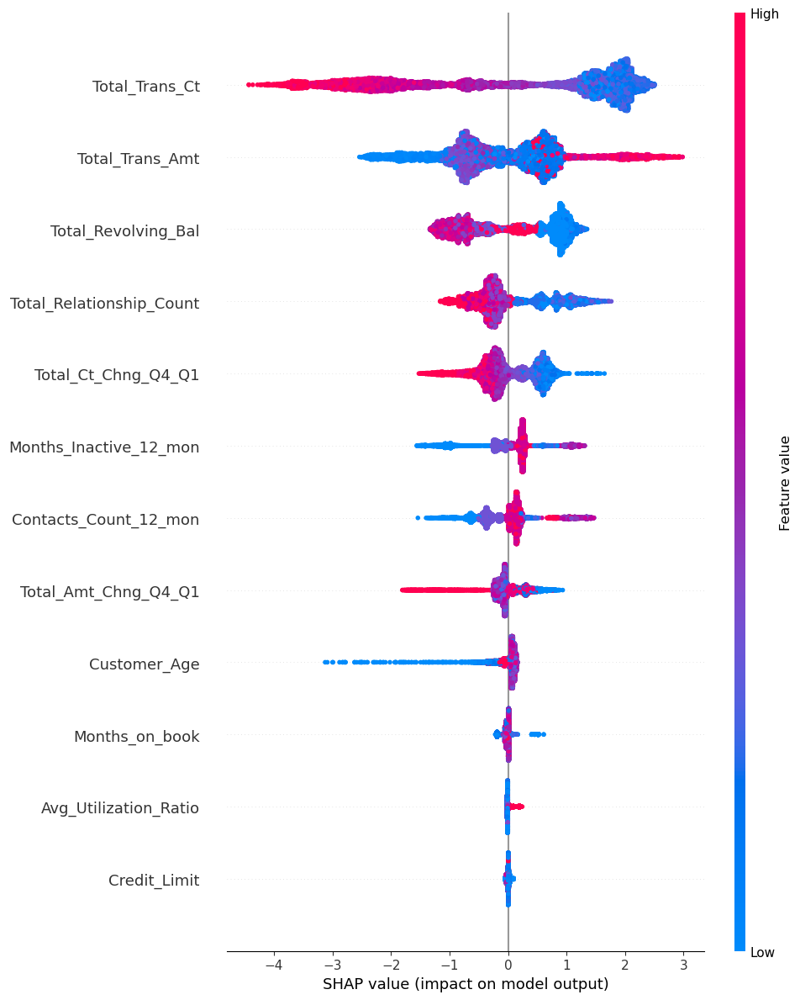

<Figure size 640x480 with 0 Axes>

In [298]:
import shap

# load JS visualization code to notebook
shap.initjs()

# create the SHAP explanation summary
explainer = shap.TreeExplainer(model_gbm)
shap_values = explainer.shap_values(X_train_sm)
shap.summary_plot(shap_values, features=X_train_sm, feature_names=X_train_sm.columns, 
                  plot_size=[10,12], show=True)
plt.savefig('./fig.png')

In [301]:
i = 0
shap.force_plot(explainer.expected_value, shap_values[i], features=X_train_sm.iloc[i], 
                feature_names=X_train_sm.columns)

In [303]:
shap_values = explainer(X_test)
shap.plots.waterfall(shap_values[1])

Exception: waterfall_plot requires a scalar base_values of the model output as the first parameter, but you have passed an array as the first parameter! Try shap.waterfall_plot(explainer.base_values[0], values[0], X[0]) or for multi-output models try shap.waterfall_plot(explainer.base_values[0], values[0][0], X[0]).

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">7. Customer Segmentation</h1>

# <span style="color:magenta"> 7.1 Segmentation strategies: 

### There are generally 4 types of customer segmentation: 
1. Demographic Segmentation
2. Behavioral Segmentation
3. Geographic Segmentation
4. Psychographic Segmentation

### Summary of types of features in the dataset and their contribution to churn (cufoff: phiK socre 0.2) (I don't know how accurate it is to use phiK score to judge numerical columns):

|Feature|Group:|Data Type|Churn Contribution|
|:------------------------:|:--------:|:--------:|:---------------------------:|
|Gender                  |Demographic|Cat |No|
|Marital_Status          |Demographic|Cat |No|
|Educational_Level       |Demographic|Cat |No|
|Income_Category         |Demographic|Cat |No|
|Customer_Age            |Demographic|Num |No|
|Dependent_count         |Demographic|Num |No|
|Card_Category           |Behavioral |Cat |No|
|Months_on_book          |Behavioral |Num |No|
|Months_Inactive_12_mon  |Behavioral |Num |No|
|Contacts_Count_12_mon   |Behavioral |Num |No|
|Total_Relationship_Count|Behavioral |Num |Yes|
|Credit_Limit            |Behavioral |Num |No |
|Avg_Open_To_Buy         |Behavioral |Num |No |
|Total_Trans_Ct          |Behavioral |Num |Yes|
|Total_Trans_Amt         |Behavioral |Num |Yes|
|Avg_Utilization_Ratio   |Behavioral |Num |Yes|
|Total_Revolving_Bal     |Behavioral |Num |Yes|
|Total_Ct_Chng_Q4_Q1     |Behavioral |Num |Yes|
|Total_Amt_Chng_Q4_Q1    |Behavioral |Num |No |


### From the summary, we observe:
1. There are two groups of features: Demographic (6) and Behavioral features (13)
2. Demographic features: Most are categorical features. All features contribute little to  churn decisions.
3. Behavioral features: Most are numerical features. The only categorical feature is card type, which also contribute very little to churning since there is one dominant type-blue card. Most numerical features in this group contribute to churn decisions.

### <span style="color:red">Outline of strategies:</span>
1. Customer segmentation on Demographic information: We will use KModes clustering algorithm to cluster customers based on demographic information since most features in the group are categorical. We will bin Customer_Age to 6 groups and change Dependent_count column to categorical column.
    - Use elbow curve to find optimal K value.
    - Examine distribution of churners in each cluster. Hope to enrich churner in certain cluster(s) for marketing strategies design based on cluster charaterization.
2. Customer segmentation on Behavioral information: We will use Kmeans clustering algorithm to cluster customers based on behavioral information since most features in the group are numerical. We will use Onehot encoding to transform column Card_type or just eliminate it from the analysis since blue card customers dominate the group and hence not likely to contribute much to clustering.

### <span style="color:red"> This is a backup plan if both clustering analysis using either demographic features or behavioral features fail.
We are going to use k-Prototype algorithms since there are both num and cat features
1. There are significant amount of unknown in columns Education_Level, Marital_Status, Income_Category
2. We are going to fillin unknown with mode for Education_Level and Income_Category
3. Leave unknown as a category in column Marital_Status
4. Binning Customer age to groups as '<30','30-40','40-50','50-60','>60'
5. Convert numeric data in Dependent_count to Categorical data
6. We should end up with all categorical data for demog_col
7. Use KMode clustering to segment customers

# <span style="color:magenta">7.2 Customer segmentation based on demographic features

## <span style="color:blue">7.2.1 Data processing for Kmodes clustering

In [99]:
demo_col = ['Gender','Marital_Status','Education_Level','Income_Category',
             'Customer_Age', 'Dependent_count']

In [100]:
df_demo = df[demo_col]
df_demo.head()

,Gender,Marital_Status,Education_Level,Income_Category,Customer_Age,Dependent_count
0,M,Married,High School,$60K - $80K,45,3
1,F,Single,Graduate,Less than $40K,49,5
2,M,Married,Graduate,$80K - $120K,51,3
3,F,Unknown,High School,Less than $40K,40,4
4,M,Married,Uneducated,$60K - $80K,40,3


### We are going to use KModes algorithms to cluster customers since most features are categorical
- Customer_Age column: we will bin the column to 6 groups to transform the column to categorical
- Dependent_count: we will change the data type directly to categorical

In [101]:
# group Customer_Age into 6 groups: <20, 20-30, 30-40, 40-50, 50-60, >60
converter = lambda x: '<30' if (x <= 30) else \
                        ('30-40' if (x > 30 and x <= 40) else \
                        ('40-50' if (x > 40 and x <= 50) else \
                        ('50-60' if (x > 50 and x <= 60) else \
                        '>60')))

df_demo['Customer_Age'] = df_demo['Customer_Age'].apply(converter)

/var/folders/h6/8dbynfrj3m5gmc3w4h17pvs80000gn/T/ipykernel_53764/3083063008.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_demo['Customer_Age'] = df_demo['Customer_Age'].apply(converter)


In [102]:
# convert column Dependent_count to categorical column
df_demo['Dependent_count'] = pd.Categorical(df_demo['Dependent_count'])
#df_demo.loc[:, 'Dependent_count'].astype('O')

/var/folders/h6/8dbynfrj3m5gmc3w4h17pvs80000gn/T/ipykernel_53764/4045216484.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_demo['Dependent_count'] = pd.Categorical(df_demo['Dependent_count'])


In [103]:
df_demo.head()

,Gender,Marital_Status,Education_Level,Income_Category,Customer_Age,Dependent_count
0,M,Married,High School,$60K - $80K,40-50,3
1,F,Single,Graduate,Less than $40K,40-50,5
2,M,Married,Graduate,$80K - $120K,50-60,3
3,F,Unknown,High School,Less than $40K,30-40,4
4,M,Married,Uneducated,$60K - $80K,30-40,3


In [104]:
df_demo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   Gender           10127 non-null  object  
 1   Marital_Status   10127 non-null  object  
 2   Education_Level  10127 non-null  object  
 3   Income_Category  10127 non-null  object  
 4   Customer_Age     10127 non-null  object  
 5   Dependent_count  10127 non-null  category
dtypes: category(1), object(5)
memory usage: 405.8+ KB


## Question: is K-means/K-modes clustering algorithm affected by collinearity?

**Chat-GPT:** 

Yes, K-means/K-modes clustering can be affected by collinearity. Collinearity refers to the situation where two or more predictor variables are highly correlated with each other. When collinearity is present in the data, it can cause problems with the interpretation of the results of K-means/K-modes clustering or other statistical analyses.

One way that collinearity can affect K-means/K-modes clustering is by making it more difficult to interpret the results of the analysis. When collinearity is present, the contribution of each predictor variable to the overall cluster solution may be confounded with the contribution of the other collinear variables. This can make it difficult to understand the underlying structure of the data and to identify the variables that are most important in defining the clusters.

Another way that collinearity can affect K-means/K-modes clustering is by increasing the variance of the estimates of the cluster means. When collinearity is present, the estimates of the cluster means may be more unstable and less precise, leading to less reliable conclusions about the structure of the data.

Overall, it is important to be aware of the potential effects of collinearity when using K-means/K-modes clustering or any other statistical analysis, and to take steps to address collinearity if it is present in the data. This can involve techniques such as variable selection or dimensionality reduction to eliminate redundant or highly correlated variables from the analysis.

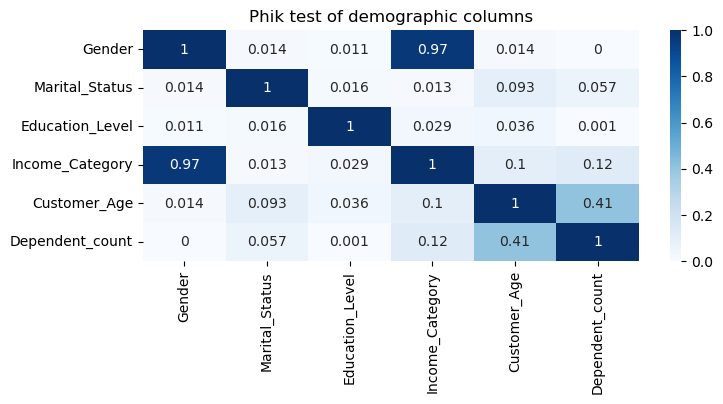

In [105]:
result_demo = df_demo.phik_matrix()
fig = plt.figure(figsize=(8,3))
sns.heatmap(result_demo, annot=True, cmap='Blues')
plt.title('Phik test of demographic columns')
plt.show()

### As we have observed in EDA, columns Income_Category and Gender are highly correlated. I am going to drop column Gender from K-modes clustering analysis

In [106]:
df_demo = df_demo.drop(['Gender'], axis=1)
df_demo.head()

,Marital_Status,Education_Level,Income_Category,Customer_Age,Dependent_count
0,Married,High School,$60K - $80K,40-50,3
1,Single,Graduate,Less than $40K,40-50,5
2,Married,Graduate,$80K - $120K,50-60,3
3,Unknown,High School,Less than $40K,30-40,4
4,Married,Uneducated,$60K - $80K,30-40,3


## <span style="color:blue">7.2.2 Kmodes clustering

In [107]:
from kmodes.kmodes import KModes

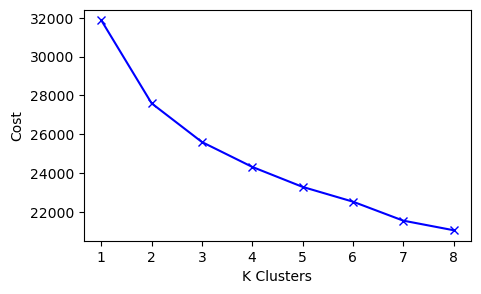

In [71]:
# Use Elbow curve to find optimal K for Kmodes clustering

cost = [] 
K = range(1,9)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5)
    kmode.fit_predict(df_demo)
    cost.append(kmode.cost_)
    
fig = plt.figure(figsize=(5,3))    
plt.plot(K, cost, 'bx-')
plt.xlabel('K Clusters')
plt.ylabel('Cost')
plt.show()

In [72]:
# Building the model with 4 clusters
# Method for initialization: init: {'Huang', 'Cao', 'random' or an ndarray}, default: 'Cao'
# n_init : int, default: 10. Number of time the k-modes algorithm will be run with different
# centroid seeds. The final results will be the best output of n_init consecutive runs in terms of cost.
kmode = KModes(n_clusters=4, init = "random", n_init = 5)
clusters = kmode.fit_predict(df_demo)

In [73]:
df['kmode_cluster'] = clusters
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,kmode_cluster
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,2
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0


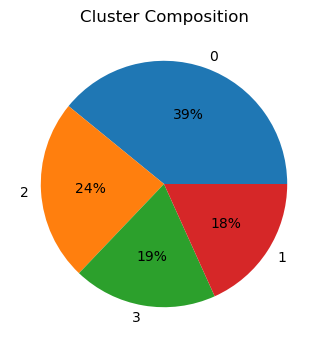

In [74]:
fig, axs = plt.subplots(figsize=(8,4))
ax = df['kmode_cluster'].value_counts().plot.pie(title='Cluster Composition', autopct='%1.0f%%')
plt.title=False
ax.set_ylabel('')
plt.show()

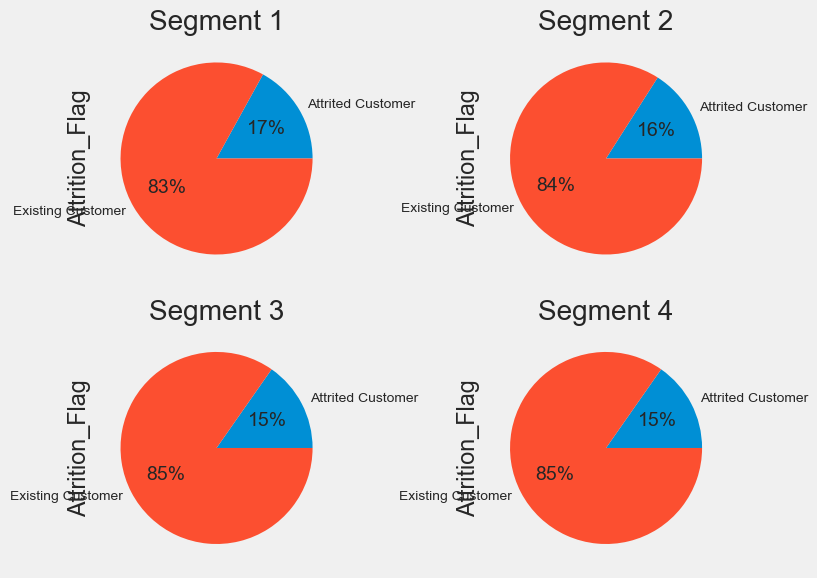

In [114]:
fig, axs = plt.subplots(ncols=2,nrows=2, figsize=(8,6))
fig.subplots_adjust(hspace=0.2, wspace=0.2)
df[df['kmode_cluster'] == 0]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,0], title='Segment 1',autopct='%1.0f%%')
df[df['kmode_cluster'] == 1]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,1], title='Segment 2',autopct='%1.0f%%')
df[df['kmode_cluster'] == 2]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,0], title='Segment 3',autopct='%1.0f%%')
df[df['kmode_cluster'] == 3]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,1], title='Segment 4',autopct='%1.0f%%')
plt.tight_layout()

## <span style="color:blue">7.2.3 Summary</span>
**1. Customers were segmented relatively evenly into 4 clusters** <br>
**2. We don not observe churner enrichment in any customer segment**

# <span style="color:magenta">7.3 Customer segmentation on behavioral features

## <span style="color:blue">7.3.1 Data processing for Kmeans clustering

Let us try to use KMeans to cluster the customers based on their behavioral features (credit card account activity), and then examine: 

1. the demographic data of each cluster to see if they differ in a meaningful way.
2. distrubution of churners in each cluster to see if churners enrich in certain cluster(s).

**KMeans** is a clustering algorithm that groups data points together based on how similar they are to each other. When we specify the number of clusters, K, that number of data points are randomly chosen as cluster centroids, and all the other data points are assigned to the cluster of the closest centroid. The centroid is then reassigned so that it becomes the average of the cluster.

This process is repeated until the size of the clusters becomes stable.

In [76]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [77]:
# KMeans only takes numeric data, and phiK score between Card_Category and Attrition_Flag is 0
# So I am going to exclude Card_Category from KMeans clustering
behv_col_total = ['Months_on_book', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 
            'Total_Relationship_Count', 'Credit_Limit', 'Avg_Open_To_Buy',  
            'Avg_Utilization_Ratio', 'Total_Trans_Amt', 'Total_Trans_Ct', 
            'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']

<AxesSubplot:>

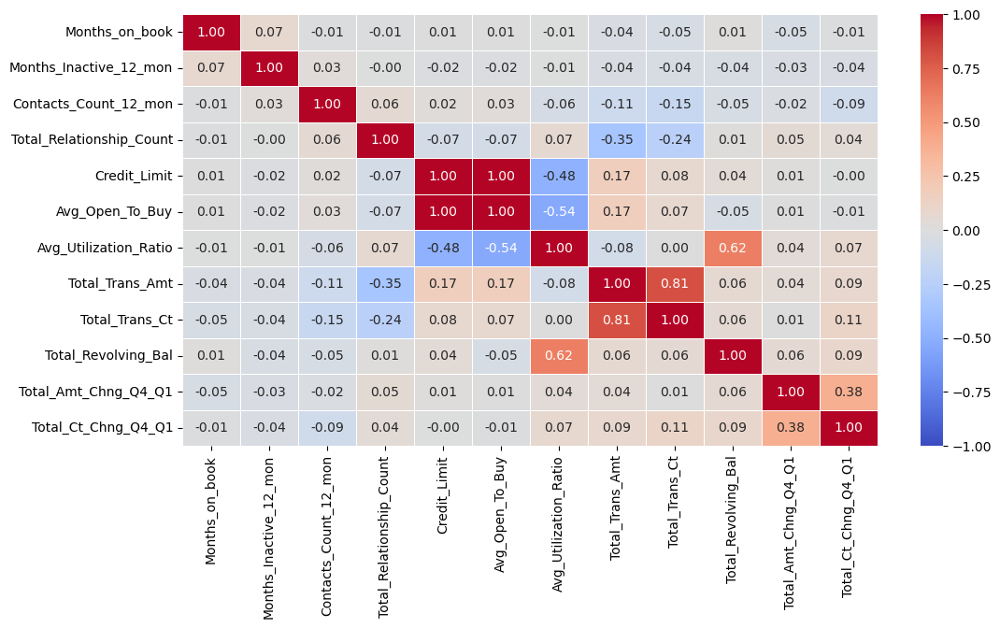

In [78]:
# Let check the Pearson correlation between behavioral features
plt.figure(figsize=(12,6))
sns.heatmap(df[behv_col_total].corr(), 
            vmin=-1.0, 
            vmax=1.0, 
            linewidths=0.5, 
            cmap='coolwarm', 
            annot=True, 
            fmt='.2f')

### There are two pairs of features highly correlated. I decide to perform the following feature engineering to process data for KMeans Clustering:
1. Drop column Avg_Open_To_Buy since it correlates very well with Credit_limit;
2. Drop column Total_Trans_Amt since it correlates very well with Total_Trans_Ct and Total_Trans_Ct correlates stronger with Attrition in phiK test. We have tried to generate a new column using Total_Trans_Amt/Total_Trans_Ct. New features correlates weaker with Attrition compared to Total_Trans_Ct.

In [79]:
behv_col = ['Months_on_book', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon',
            'Total_Relationship_Count', 'Credit_Limit',  
            'Avg_Utilization_Ratio', 'Total_Trans_Ct',
            'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']

### Another question I have for KMeans Clustering is : do we need to do feature selection for kmeans clustering algorithm?

**According to Chat-GPT:**

Feature selection is the process of selecting a subset of relevant features for use in model construction. In the context of k-means clustering, feature selection can be useful for several reasons:

Reducing the complexity of the model: By selecting a smaller number of features, you can reduce the dimensionality of the data and make the clustering process more efficient.

Improving the interpretability of the model: By selecting a smaller number of features, it can be easier to understand the clusters that are formed and how they relate to the original features.

Improving the performance of the model: By selecting the most relevant features, you can potentially improve the quality of the clusters that are formed.

However, it is not always necessary to perform feature selection before applying k-means clustering. In some cases, the algorithm may be able to identify meaningful clusters even with a large number of features. It is always a good idea to explore the data and consider the potential benefits of feature selection before deciding whether to apply it.

### We only have 10 features here. Dimension is not very bad for KMeans Clustering. Does it worth doing feature selection for Kmeans clustering? 

**I did some tests. I ranked features based on their phiK score with column "Attrition", and started to select top features for Kmeans clustering analysis. It looked like Kmeans clustering segments customer better with less features used. Here are results of some tests (churners were separated better with 6 clusters in most cases):**

### if top 2 features were used (Total_Trans_Ct(0.59), Total_Revolving_Bal(0.52)):
|Customer Segment|% Customers included|%Churner in the segment|%Churner covered|
|:----:|:--------:|:--------:|:--------:|
|1  |8% |100%|8%|
|2  |20%|18%|3.6%|
|3  |24%|2%|0.48%|
|4  |15%|12%|1.8%|
|5  |18%|4%|0.72%|
|6  |15%|6%|0.9%|

### if top 3 features were used (Total_Trans_Ct(0.59), Total_Revolving_Bal(0.52), Total_Ct_Chng_Q4_Q1(0.41)):

|Customer Segment|% Customers included|%Churner in the segment|%Churner covered|
|:----:|:--------:|:--------:|:--------:|
|1  |33%|2% |0.66%|
|2  |13%|67%|8.7% |
|3  |7% |5% |0.35%|
|4  |10%|0% |0%   |
|5  |16%|22%|3.5% |
|6  |21%|12%|2.5% |


### if top 4 features were used (Total_Trans_Ct(0.59), Total_Revolving_Bal(0.52), Total_Ct_Chng_Q4_Q1(0.41), Avg_Utilization_Ratio(0.31)):

|Customer Segment|% Customers included|%Churner in the segment|%Churner covered|
|:----:|:--------:|:--------:|:--------:|
|1  |21%|3% |0.63%|
|2  |18%|14%|2.5% |
|3  |6% |3% |0.18%|
|4  |25%|2% |0.5% |
|5  |14%|62%|8.7% |
|6  |16%|22%|3.5% |

### if all 10 features were used:

|Customer Segment|% Customers included|%Churner in the segment|%Churner covered|
|:----:|:--------:|:--------:|:--------:|
|1  |28%|10% |2.8%|
|2  |13%|12%|1.6% |
|3  |17% |3% |0.51%|
|4  |7%|3% |0.21% |
|5  |19%|11%|2.1% |
|6  |16%|56%|9% |

The results suggest it might worth doing feature selection for KMeans Clustering at least for this dataset. 

There are different ways to do feature selection. We can just set an arbitrary cutoff and select top features like I did in the above testing. Another strategy is wrapper method. But I can not find a good example to use wrapper method with unsupervised KMeans Clustering.

### I will use top 3 features for clustering: Total_Trans_Ct (0.59), Total_Revolving_Bal (0.52), Total_Ct_Chng_Q4_Q1 (0.41)). They are also quite independent from each other.

In [80]:
behv_col_kmeans = ['Total_Trans_Ct', 'Total_Revolving_Bal', 'Total_Ct_Chng_Q4_Q1']

In [81]:
df[behv_col_kmeans].head()

,Total_Trans_Ct,Total_Revolving_Bal,Total_Ct_Chng_Q4_Q1
0,42,777,1.625
1,33,864,3.714
2,20,0,2.333
3,20,2517,2.333
4,28,0,2.500


## <span style="color:blue">7.3.2 KMeans clustering

When using KMeans, we have to specify the number of clusters. One way to find the ideal number of clusters is the elbow method.

The **elbow method** allows us to identify at which K value the sum of squared distance, or the distance between data points and their respective centroids, begins to level off. 

The sum of squared distance flattening indicates that increasing the amount of clusters is not leading to better-defined clusters, so it is a good method to use when trying to find an optimal value for K.

Let's use the elbow method to select our value for K.

In [82]:
# First, we need to scale the data
sd = StandardScaler()
df_behv_kmeans = sd.fit_transform(df[behv_col_kmeans])
#df_behv_sub = sd.fit_transform(df[behv_col_sub])
df_behv_kmeans

array([[-0.97389518, -0.47342222,  3.8340026 ],
       [-1.35734038, -0.36666682, 12.60857291],
       [-1.91120566, -1.42685834,  6.80786367],
       ...,
       [-0.20700479, -1.42685834,  0.44430503],
       [-0.12179474, -1.42685834,  0.04106963],
       [-0.16439977,  0.97943283, -0.26555729]])

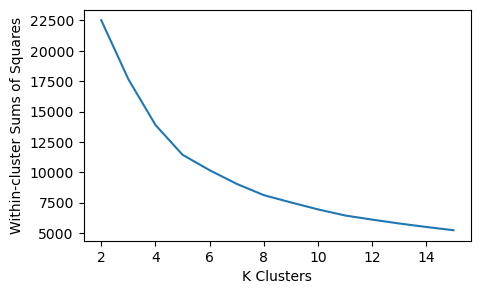

In [84]:
# try elbow method for optimal K
wcss = []
for i in range(2,16):
    km = KMeans(n_clusters = i, n_init = 10, max_iter = 500, random_state=2022)
    km.fit(df_behv_kmeans)
    wcss.append(km.inertia_)

fig = plt.figure(figsize=(5,3))
plt.plot(range(2,16), wcss)
plt.xlabel('K Clusters')
plt.ylabel('Within-cluster Sums of Squares')
plt.show()

### Perform Comparative Analysis to Determine Best Value of K Using Silhouette Plot
(https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam)

Silhouette score is used to evaluate the quality of clusters created using clustering algorithms such as K-Means in terms of how well samples are clustered with other samples that are similar to each other. The Silhouette score is calculated for each sample of different clusters. The value of the Silhouette score varies from -1 to 1. If the score is 1, the cluster is dense and well-separated than other clusters. A value near 0 represents overlapping clusters with samples very close to the decision boundary of the neighboring clusters. A negative score [-1, 0] indicates that the samples might have got assigned to the wrong clusters.

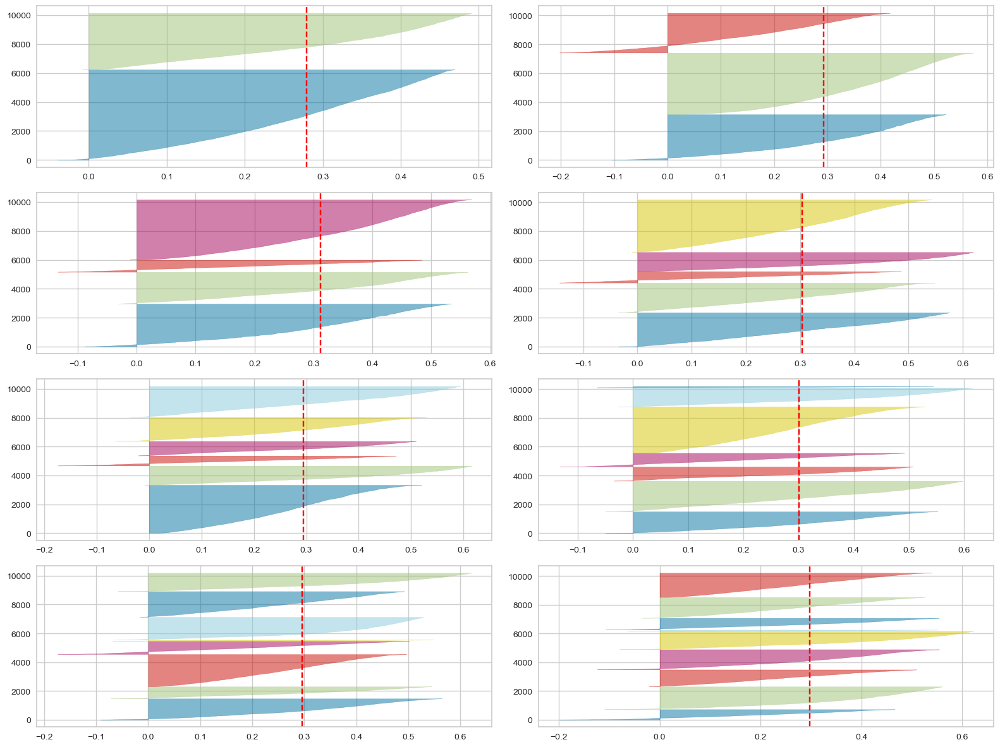

In [85]:
# The divmod() method takes two numbers as arguments and 
# returns their quotient and remainder in a tuple.
# for example result = divmod(8, 3), then result = (2,2)
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(4, 2, figsize=(16,12))
for i in [2,3,4,5,6,7,8,9]:
    #Create KMeans instance for different number of clusters
    km = KMeans(n_clusters = i, n_init = 10, max_iter = 500, random_state=2022)
    q, mod = divmod(i, 2)
   
    #Create SilhouetteVisualizer instance with KMeans instance. Fit the visualizer
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df_behv_kmeans)
plt.tight_layout()

In [86]:
# selected k (k=6)
km = KMeans(n_clusters = 6, n_init = 10, max_iter = 500, random_state=2022)
cluster_labels = km.fit_predict(df_behv_kmeans)

In [87]:
df['customer_group'] = cluster_labels
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,kmode_cluster,customer_group
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,2,2
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,2
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0,2
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1,2
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0,2


In [88]:
df['customer_group'].value_counts()

0    3331
5    2140
4    1652
1    1322
3     994
2     688
Name: customer_group, dtype: int64

## <span style="color:blue">7.3.3 Clustering visulization

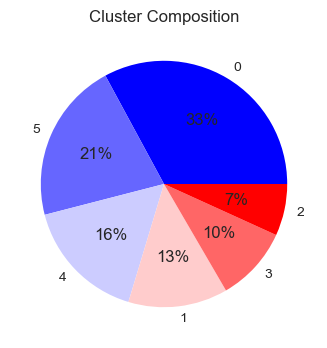

In [89]:
fig, axs = plt.subplots(figsize=(8,4))
ax = df['customer_group'].value_counts().plot.pie(title='Cluster Composition', autopct='%1.0f%%', cmap='bwr')
plt.title=False
ax.set_ylabel('')
plt.show()

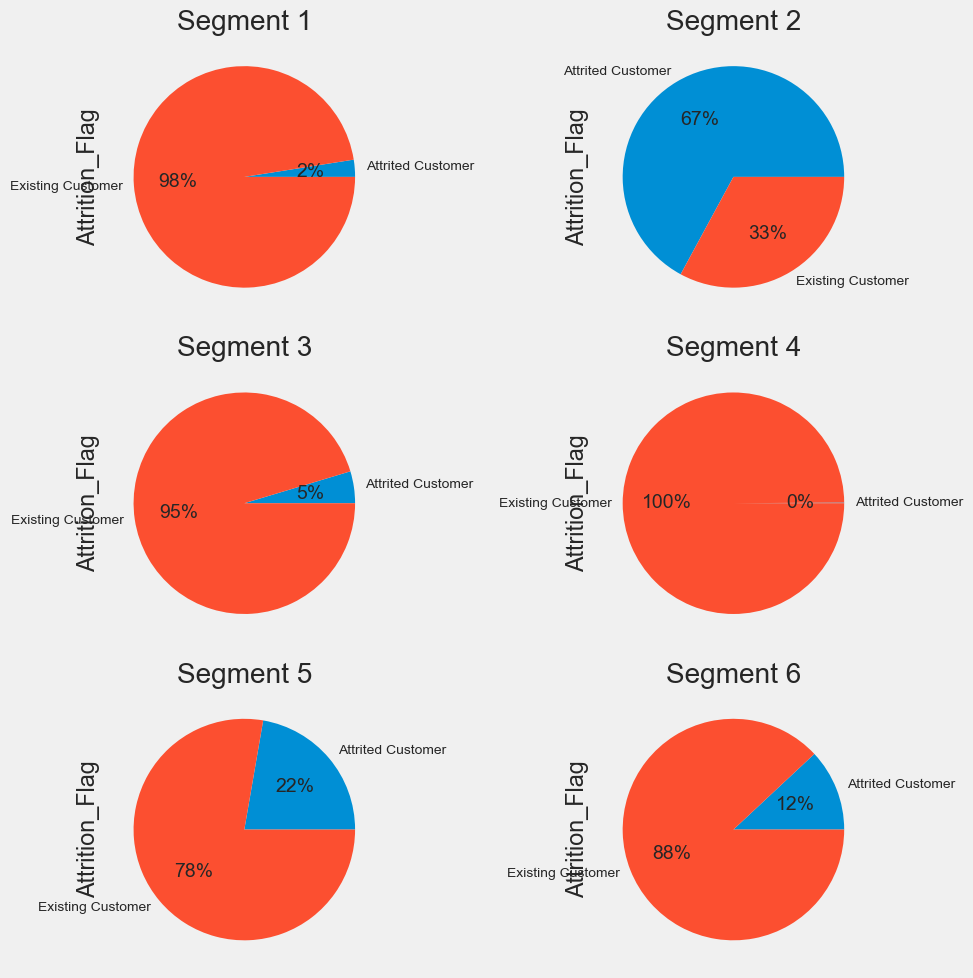

In [117]:
fig, axs = plt.subplots(ncols=2,nrows=3, figsize=(10,10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df[df['customer_group'] == 0]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,0], title='Segment 1',autopct='%1.0f%%')
df[df['customer_group'] == 1]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,1], title='Segment 2',autopct='%1.0f%%')
df[df['customer_group'] == 2]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,0], title='Segment 3',autopct='%1.0f%%')
df[df['customer_group'] == 3]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,1], title='Segment 4',autopct='%1.0f%%')
df[df['customer_group'] == 4]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[2,0], title='Segment 5',autopct='%1.0f%%')
df[df['customer_group'] == 5]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[2,1], title='Segment 6',autopct='%1.0f%%')
#df[df['customer_group'] == 6]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[3,0], title='Segment 7',autopct='%1.0f%%')
#df[df['customer_group'] == 7]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[3,1], title='Group 8',autopct='%1.0f%%')
plt.tight_layout()

### Visuliza clusters using PCA and T-SNE

In [91]:
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

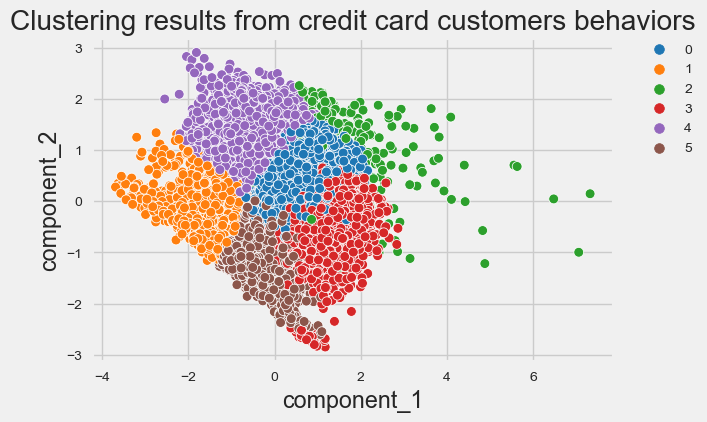

In [119]:
pca = PCA(n_components=2, random_state=2022)
df_behv_pca = pd.DataFrame(pca.fit_transform(df_behv_kmeans), 
                           columns=["component_1", "component_2"])
df_behv_pca['customer_group'] = cluster_labels

plt.style.use("fivethirtyeight")
plt.figure(figsize=(6, 4))
sp = sns.scatterplot(
        x="component_1",
        y="component_2",
        s=50,
        data=df_behv_pca,
        hue="customer_group",
        palette='tab10'
    )
   
sp.set_title(
        "Clustering results from credit card customers behaviors"
    )
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)   
plt.show()

In [93]:
from sklearn.manifold import TSNE

In [94]:
tsne= TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3,
                  random_state= 42)
df_behv_tsne = pd.DataFrame(tsne.fit_transform(df_behv_kmeans), 
                           columns=["tsne_component_1", "tsne_component_2"])
df_behv_tsne['customer_group'] = cluster_labels
df_behv_tsne.head()

,tsne_component_1,tsne_component_2,customer_group
0,-72.114456,-50.375298,2
1,-85.153694,-57.243286,2
2,-86.754196,-63.414589,2
3,-76.796234,-64.244644,2
4,-86.691986,-63.220150,2


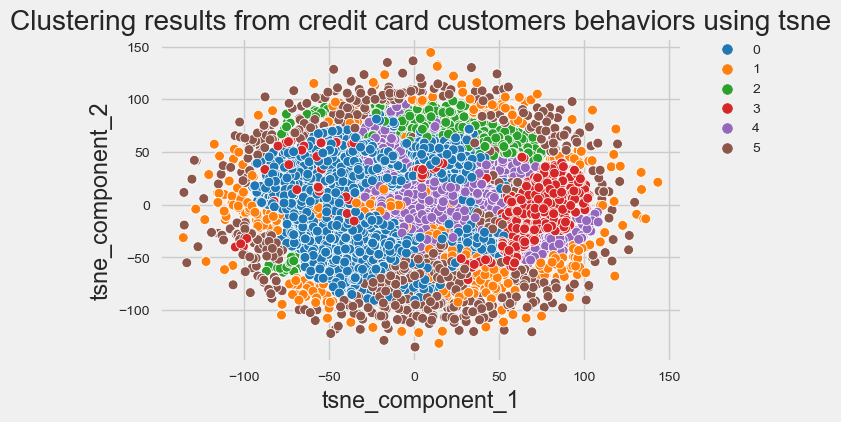

In [120]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(6, 4))
sp = sns.scatterplot(
        x="tsne_component_1",
        y="tsne_component_2",
        s=50,
        data=df_behv_tsne,
        hue="customer_group",
        palette='tab10'
    )
   
sp.set_title(
        "Clustering results from credit card customers behaviors using tsne"
    )
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)   
plt.show()

## <span style="color:blue">7.3.4 Clusters chracterization

### Summary of churner distribution in customer segments

|Customer Segment|% Customers included|%Churner in the segment|%Churner covered|
|:----:|:--------:|:--------:|:--------:|
|1  |33%|2% |0.66%|
|2  |13%|67%|8.7% |
|3  |7% |5% |0.35%|
|4  |10%|0% |0%   |
|5  |16%|22%|3.5% |
|6  |21%|12%|2.5% |

### We can see churners enriched in segments 2, 5, 6. 
### Half of churners lie in segment 2.
### Next charaterize each segment.

In [96]:
df_behv = sd.fit_transform(df[behv_col])

In [97]:
df_behv_cluster = pd.DataFrame(df_behv, columns=behv_col)
df_behv_cluster['customer_group'] = cluster_labels
df_behv_cluster

,Months_on_book,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Relationship_Count,Credit_Limit,Avg_Utilization_Ratio,Total_Trans_Ct,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,customer_group
0,0.384621,-1.327136,0.492404,0.763943,0.446622,-0.775882,-0.973895,-0.473422,2.623494,3.834003,2
1,1.010715,-1.327136,-0.411616,1.407306,-0.041367,-0.616276,-1.357340,-0.366667,3.563293,12.608573,2
2,0.008965,-1.327136,-2.219655,0.120579,-0.573698,-0.997155,-1.911206,-1.426858,8.367214,6.807864,2
3,-0.241473,1.641478,-1.315636,-0.522785,-0.585251,1.759686,-1.911206,1.661686,2.942843,6.807864,2
4,-1.869317,-1.327136,-2.219655,0.763943,-0.430877,-0.997155,-1.570365,-1.426858,6.455682,7.509325,2
...,...,...,...,...,...,...,...,...,...,...,...
10122,0.509840,-0.337598,0.492404,-0.522785,-0.509330,0.678714,2.221481,0.844455,-0.259771,0.608119,3
10123,-1.368442,-0.337598,0.492404,0.120579,-0.479181,0.856458,0.176440,1.255524,0.201004,-0.122745,0
10124,0.008965,0.651940,1.396424,0.763943,-0.354626,-0.997155,-0.207005,-1.426858,0.269436,0.444305,5
10125,0.008965,0.651940,0.492404,0.120579,-0.368710,-0.997155,-0.121795,-1.426858,-1.026208,0.041070,5


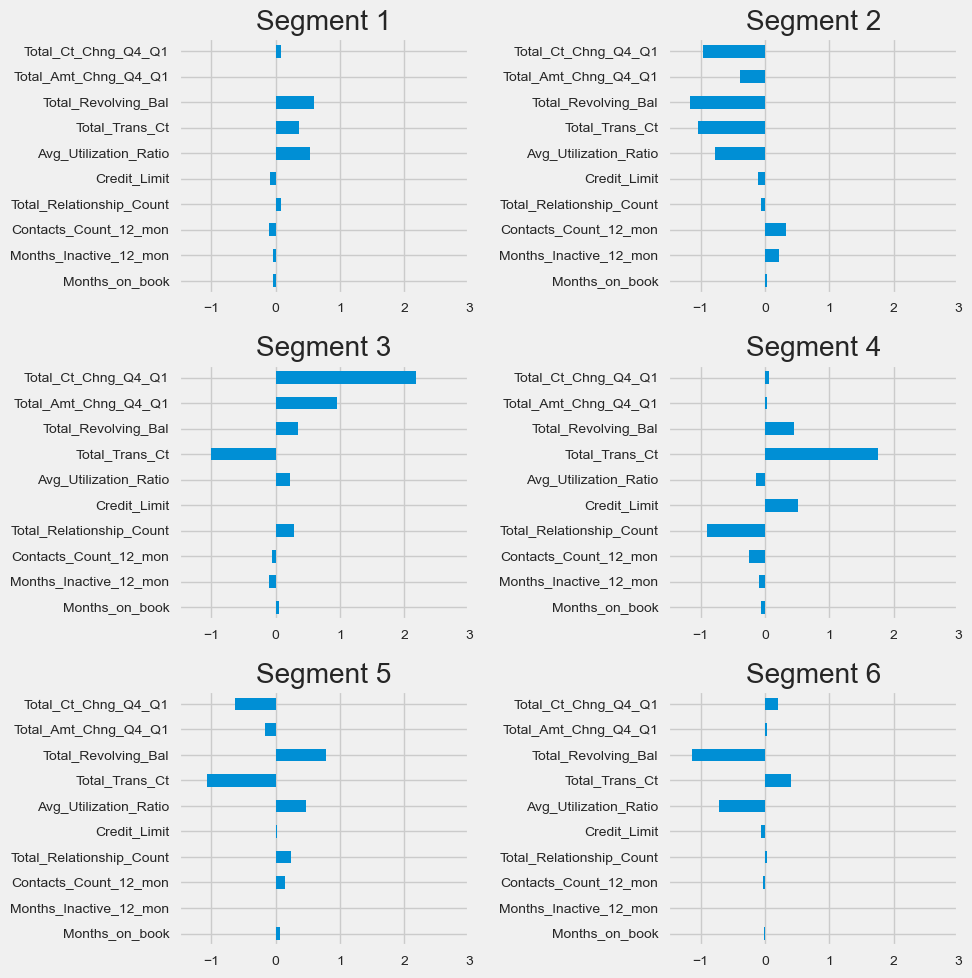

In [126]:
fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(10,10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df_behv_cluster[df_behv_cluster['customer_group'] == 0][behv_col].mean().plot.barh(ax=axs[0,0], xlim=(-1.5, 3), figsize=(10,10), title='Segment 1')
df_behv_cluster[df_behv_cluster['customer_group'] == 1][behv_col].mean().plot.barh(ax=axs[0,1], xlim=(-1.5, 3), figsize=(10,10), title='Segment 2')
df_behv_cluster[df_behv_cluster['customer_group'] == 2][behv_col].mean().plot.barh(ax=axs[1,0], xlim=(-1.5, 3), figsize=(10,10), title='Segment 3')
df_behv_cluster[df_behv_cluster['customer_group'] == 3][behv_col].mean().plot.barh(ax=axs[1,1], xlim=(-1.5, 3), figsize=(10,10), title='Segment 4')
df_behv_cluster[df_behv_cluster['customer_group'] == 4][behv_col].mean().plot.barh(ax=axs[2,0], xlim=(-1.5, 3), figsize=(10,10), title='Segment 5')
df_behv_cluster[df_behv_cluster['customer_group'] == 5][behv_col].mean().plot.barh(ax=axs[2,1], xlim=(-1.5, 3), figsize=(10,10), title='Segment 6')
plt.tight_layout()


|Segment|% Customers|% Churner|Chracteristics|Marketing Suggestion|
|:---:|:---:|:---:|:-----------------------------:|:-----------------------------:|
|1  |33% |2%  |frequent user; mid level balance|typical good book customer|
|2  |13% |67% |Very low card usage; low balance; high customer service contacts |at-risk customers; sales promotion|
|3  |7%  |5%  |High amount/account change Q4/Q1, low average usage|early good book customer; sales promotion|
|4  |10% |0%  |heavy user; high limit, single card user|good book customer; offer more cards|
|5  |16% |22% |low card usage; high balance; multiple cards|at-risk customers; offer promotion|
|6  |21% |12% |frequent user; very low balance|casual customers; offer more cards; offer sales promotion|

## <span style="color:blue">7.3.5 Demographic information of customer segments

### Next let's look at some of the demographic data for each segment.

In [99]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,kmode_cluster,customer_group
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,2,2
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,2
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0,2
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1,2
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0,2


### Age


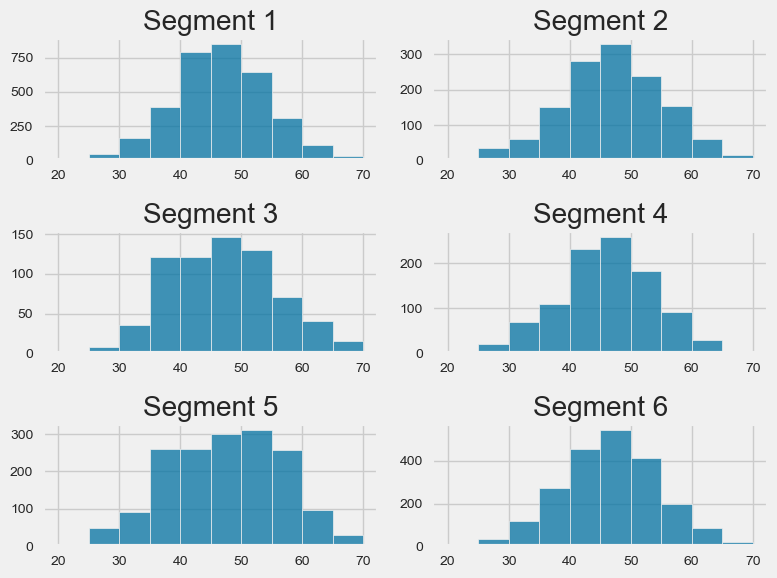

In [129]:
fig, axs = plt.subplots(ncols=2,nrows=3, figsize=(8,6))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

sns.histplot(df[df['customer_group'] == 0]['Customer_Age'], ax=axs[0,0], binrange=(20,70), binwidth=5).set(title='Segment 1', ylabel='', xlabel='')
sns.histplot(df[df['customer_group'] == 1]['Customer_Age'], ax=axs[0,1], binrange=(20,70), binwidth=5).set(title='Segment 2', ylabel='', xlabel='')
sns.histplot(df[df['customer_group'] == 2]['Customer_Age'], ax=axs[1,0], binrange=(20,70), binwidth=5).set(title='Segment 3', ylabel='', xlabel='')
sns.histplot(df[df['customer_group'] == 3]['Customer_Age'], ax=axs[1,1], binrange=(20,70), binwidth=5).set(title='Segment 4', ylabel='', xlabel='')
sns.histplot(df[df['customer_group'] == 4]['Customer_Age'], ax=axs[2,0], binrange=(20,70), binwidth=5).set(title='Segment 5', ylabel='', xlabel='')
sns.histplot(df[df['customer_group'] == 5]['Customer_Age'], ax=axs[2,1], binrange=(20,70), binwidth=5).set(title='Segment 6', ylabel='', xlabel='')
plt.tight_layout()


Segment 3 and 5 have more youg ccustomers. Segment 3 contains early stage good book young customers just start to pickup the credit card usage. On the other hand, young at risk customers in segment 5 are customers who have not developed a habit of using credit cards responsibly yet.

### Gender


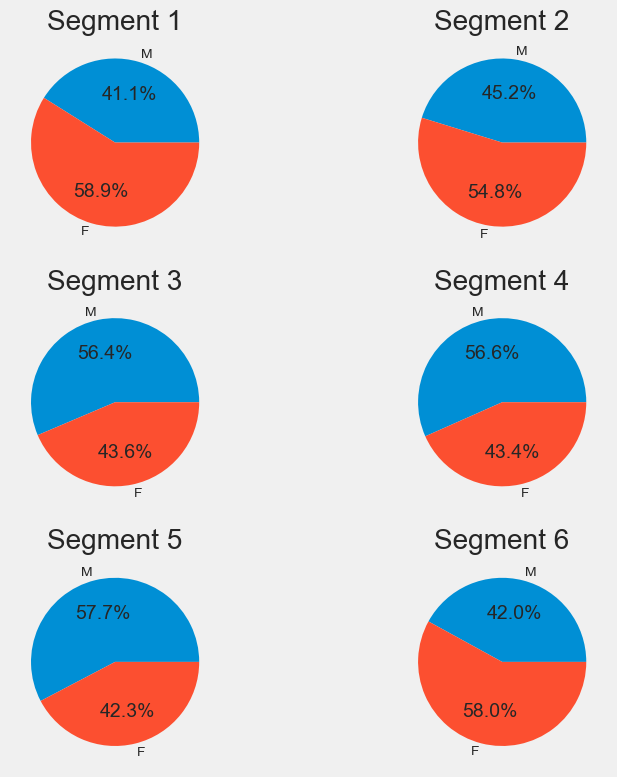

In [131]:
fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(10, 8))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df[df['customer_group'] == 0]['Gender'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,0], ylabel='', title='Segment 1', autopct='%.1f%%')
df[df['customer_group'] == 1]['Gender'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,1], ylabel='', title='Segment 2', autopct='%.1f%%')
df[df['customer_group'] == 2]['Gender'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,0], ylabel='', title='Segment 3', autopct='%.1f%%')
df[df['customer_group'] == 3]['Gender'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,1], ylabel='', title='Segment 4', autopct='%.1f%%')
df[df['customer_group'] == 4]['Gender'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,0], ylabel='', title='Segment 5', autopct='%.1f%%')
df[df['customer_group'] == 5]['Gender'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,1], ylabel='', title='Segment 6', autopct='%.1f%%')
plt.tight_layout()


More female customers in segment 1,2, and 6

### Number of Dependants


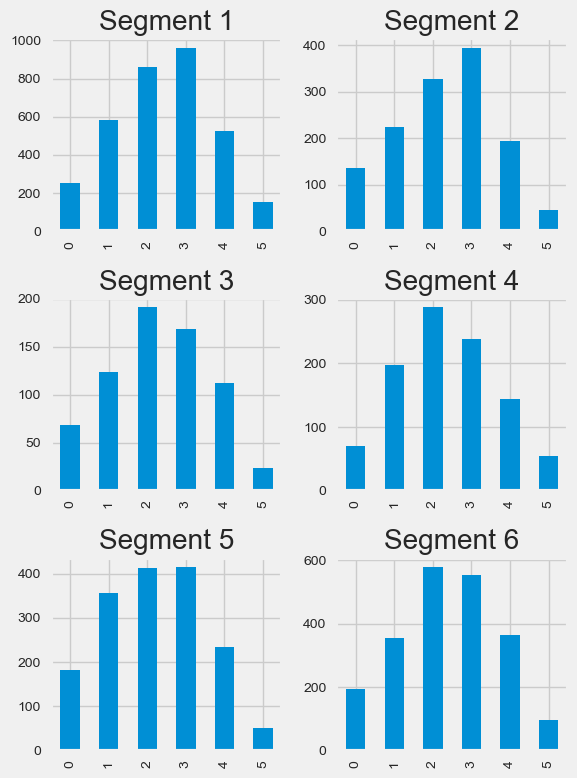

In [137]:
fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(6,8))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df[df['customer_group'] == 0]['Dependent_count'].value_counts().sort_index().plot.bar(ax=axs[0,0], title='Segment 1')
df[df['customer_group'] == 1]['Dependent_count'].value_counts().sort_index().plot.bar(ax=axs[0,1], title='Segment 2')
df[df['customer_group'] == 2]['Dependent_count'].value_counts().sort_index().plot.bar(ax=axs[1,0], title='Segment 3')
df[df['customer_group'] == 3]['Dependent_count'].value_counts().sort_index().plot.bar(ax=axs[1,1], title='Segment 4')
df[df['customer_group'] == 4]['Dependent_count'].value_counts().sort_index().plot.bar(ax=axs[2,0], title='Segment 5')
df[df['customer_group'] == 5]['Dependent_count'].value_counts().sort_index().plot.bar(ax=axs[2,1], title='Segment 6')
plt.tight_layout()


No significant differences in the number of dependants between groups.

### Number of Education Level


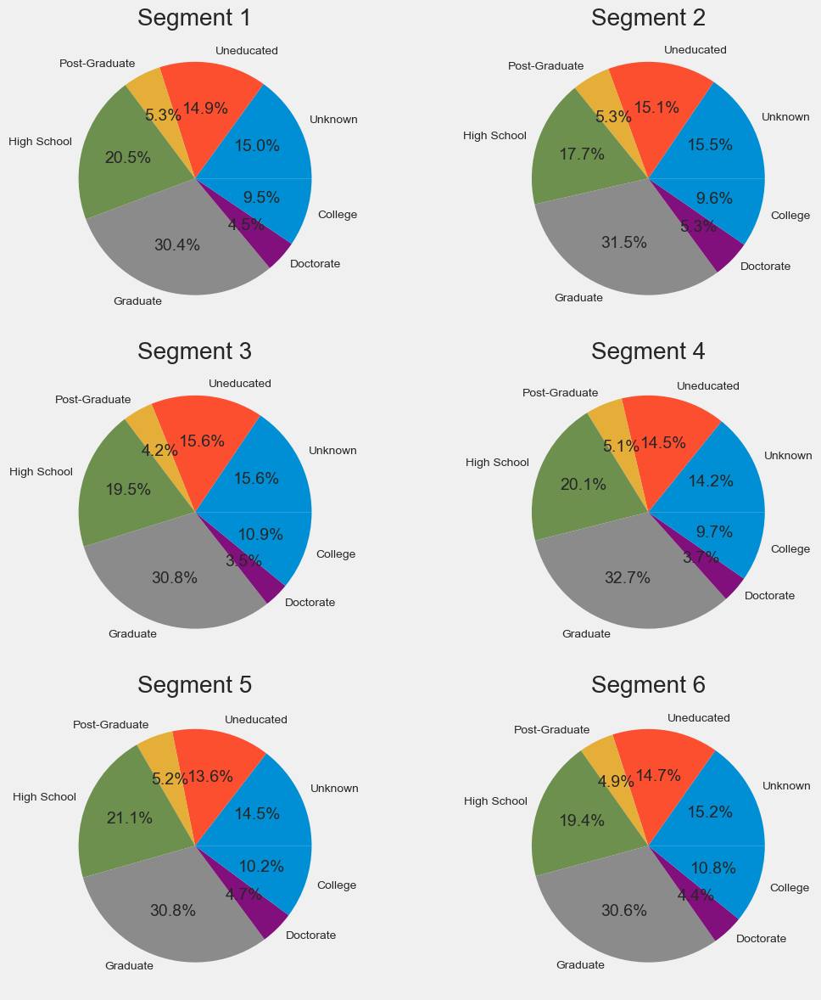

In [145]:
fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(12,12))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df[df['customer_group'] == 0]['Education_Level'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,0], ylabel='', title='Segment 1', autopct='%.1f%%')
df[df['customer_group'] == 1]['Education_Level'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,1], ylabel='', title='Segment 2', autopct='%.1f%%')
df[df['customer_group'] == 2]['Education_Level'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,0], ylabel='', title='Segment 3', autopct='%.1f%%')
df[df['customer_group'] == 3]['Education_Level'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,1], ylabel='', title='Segment 4', autopct='%.1f%%')
df[df['customer_group'] == 4]['Education_Level'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,0], ylabel='', title='Segment 5', autopct='%.1f%%')
df[df['customer_group'] == 5]['Education_Level'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,1], ylabel='', title='Segment 6', autopct='%.1f%%')
plt.tight_layout()


There doesn't seem to be any significant differences in education between groups.

### Marital Status

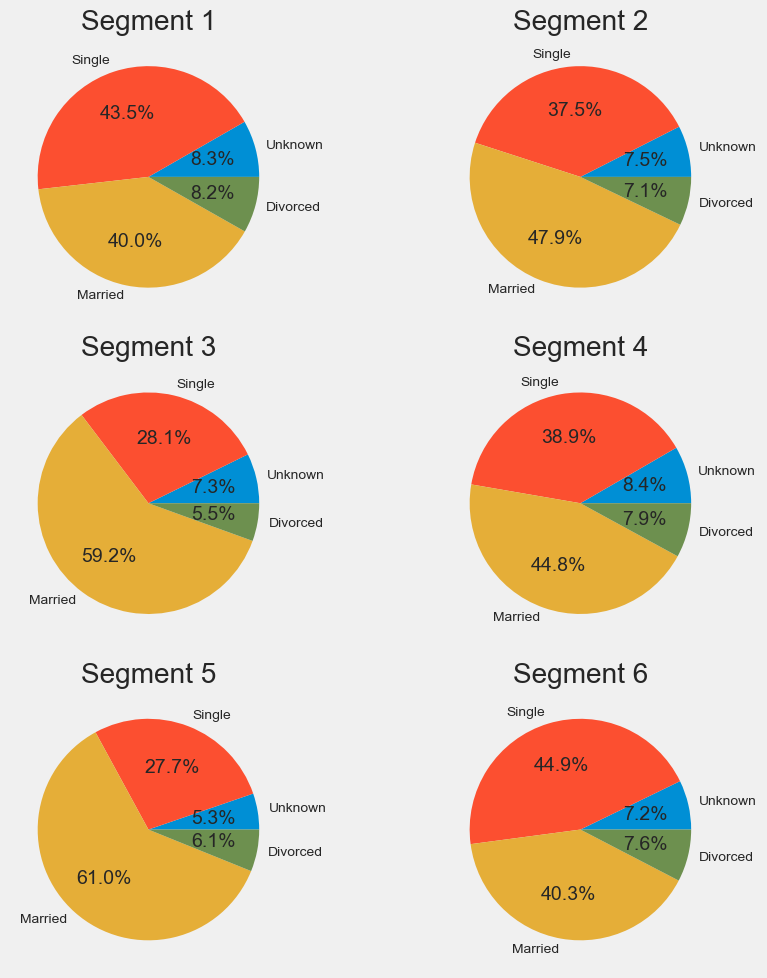

In [146]:
fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(10,10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df[df['customer_group'] == 0]['Marital_Status'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,0], ylabel='', title='Segment 1', autopct='%.1f%%')
df[df['customer_group'] == 1]['Marital_Status'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,1], ylabel='', title='Segment 2', autopct='%.1f%%')
df[df['customer_group'] == 2]['Marital_Status'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,0], ylabel='', title='Segment 3', autopct='%.1f%%')
df[df['customer_group'] == 3]['Marital_Status'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,1], ylabel='', title='Segment 4', autopct='%.1f%%')
df[df['customer_group'] == 4]['Marital_Status'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,0], ylabel='', title='Segment 5', autopct='%.1f%%')
df[df['customer_group'] == 5]['Marital_Status'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,1], ylabel='', title='Segment 6', autopct='%.1f%%')
plt.tight_layout()


There are significantly more married customers in segment 3 and 5.

### Income Level

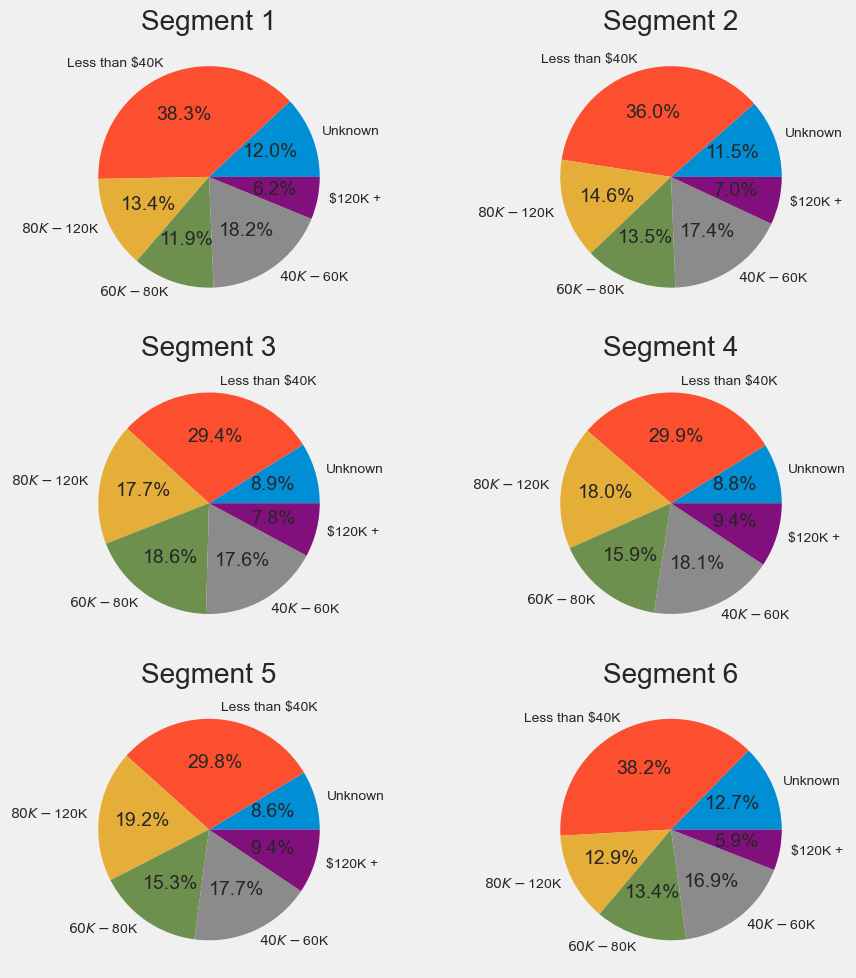

In [147]:
fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(10,10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df[df['customer_group'] == 0]['Income_Category'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,0], ylabel='', title='Segment 1', autopct='%.1f%%')
df[df['customer_group'] == 1]['Income_Category'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[0,1], ylabel='', title='Segment 2', autopct='%.1f%%')
df[df['customer_group'] == 2]['Income_Category'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,0], ylabel='', title='Segment 3', autopct='%.1f%%')
df[df['customer_group'] == 3]['Income_Category'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[1,1], ylabel='', title='Segment 4', autopct='%.1f%%')
df[df['customer_group'] == 4]['Income_Category'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,0], ylabel='', title='Segment 5', autopct='%.1f%%')
df[df['customer_group'] == 5]['Income_Category'].value_counts().sort_index(ascending=False).plot.pie(ax=axs[2,1], ylabel='', title='Segment 6', autopct='%.1f%%')
plt.tight_layout()


- More high income customers in segment 4, 5.
- More low inome customers in segment 6.


### Card Type

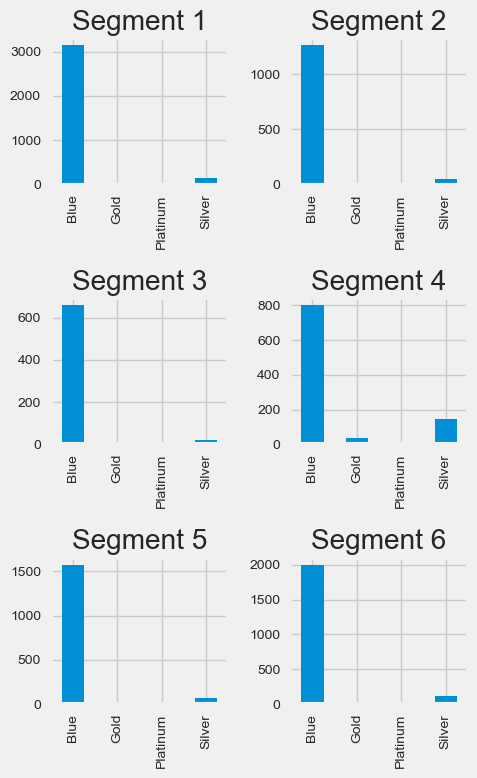

In [151]:
fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(5,8))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df[df['customer_group'] == 0]['Card_Category'].value_counts().sort_index().plot.bar(ax=axs[0,0], title='Segment 1')
df[df['customer_group'] == 1]['Card_Category'].value_counts().sort_index().plot.bar(ax=axs[0,1], title='Segment 2')
df[df['customer_group'] == 2]['Card_Category'].value_counts().sort_index().plot.bar(ax=axs[1,0], title='Segment 3')
df[df['customer_group'] == 3]['Card_Category'].value_counts().sort_index().plot.bar(ax=axs[1,1], title='Segment 4')
df[df['customer_group'] == 4]['Card_Category'].value_counts().sort_index().plot.bar(ax=axs[2,0], title='Segment 5')
df[df['customer_group'] == 5]['Card_Category'].value_counts().sort_index().plot.bar(ax=axs[2,1], title='Segment 6')
plt.tight_layout()


most silver card users and all platinum users in segment 4

# <span style="color:magenta">7.4 Summary of customer segmentation 

|Segment|% Customers|% Churner|Characteristics|Demographic characters|Marketing Suggestion|
|:---:|:---:|:---:|:-----------------------------:|:-----------------------------:|:-----------------------------:|
|1  |33% |2%  |frequent user; mid level balance|xx|typical good book customer|
|2  |13% |67% |Very low card usage; low balance; high customer service contacts |xx|at-risk customers; sales promotion|
|3  |7%  |5%  |High amount/account change Q4/Q1, low average usage|xx|early good book customer; sales promotion|
|4  |10% |0%  |heavy user; high limit, single card user|xx|good book customer; offer more cards|
|5  |16% |22% |low card usage; high balance; multiple cards|xx|at-risk customers; offer promotion|
|6  |21% |12% |frequent user; very low balance|xx|casual customers; offer more cards; offer sales promotion|

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">10. Model Deployment</h1>

<a id="4"></a>
<h1 style="background-color:orange;font-family:monospace;font-size:250%;text-align:center">11. Marketing Strategies Recommendation</h1>

In [ ]:
# for parameter tuning, let try randomsearchCV first, then use GridsearchCV to fine tune
# there are 7 (or 9 if use Lasso, ridge) parameters to tune a XGBoost model
# learning rate: [0.01, 0.05, 0.1]
# n_estimators: number of decision trees. Let try range(50,501,50)
# max_depth: 这个参数的取值最好在2-12之间. try range(4,12,2)
# min_child_weight: 和GBM的 min_sample_leaf 参数类似. For preventing overfitting. 
# gamma: 这个参数的值越大，算法越保守. try [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
# subsample: 减小这个参数的值，算法会更加保守，避免过拟合。但是，如果这个值设置得过小，它可能会导致欠拟合。
#               subsample, colsample_bytree = 0.8, 这个是最常见的初始值了。典型值的范围在0.5-1.0之间
# colsample_bytree: 和GBM里面的max_features参数类似。用来控制每棵随机采样的列数的占比(每一列是一个特征)。
#                   典型值：0.5-1
# reg_alpha: 权重的L1正则化项。(和Lasso regression类似). 可以应用在很高维度的情况下，使得算法的速度更快。
#             [0, 0.001, 0.005, 0.01, 0.05] or 0.0–1.0
# reg_lambda: 权重的L2正则化项。(和Ridge regression类似)。这个参数是用来控制XGBoost的正则化部分的。
#               虽然大部分数据科学家很少用到这个参数，但是这个参数在减少过拟合上还是可以挖掘出更多用处的。
#               0.0–1.0
import time
start = time.time()

param_xgbrs = {'learning_rate':[0.05, 0.1],
               'n_estimators':range(50,201,50),
               'max_depth':range(4,10,2), 
               'min_child_weight':range(6,15,4), 
               'gamma':[0.0, 0.25, 0.5],
               'subsample': [0.6, 0.8, 1.0],
               'colsample_bytree': [0.6, 0.8, 1.0],
               'reg_alpha':[1e-2, 0.1, 1, 100],
               'reg_lambda':[1e-2, 0.1, 1, 100],
              }

xgb_random = RandomizedSearchCV(estimator=XGBClassifier(), param_distributions=param_xgbrs, 
                n_iter=600, cv=5, random_state=2022, n_jobs=-1)
xgb_random.fit(X_train_sm, y_train_sm)

print(xgb_random.best_score_) 
print(xgb_random.best_params_)

end = time.time() 
print(f'This grid search session took {(end - start) / 60} minutes.')

[02:10:26] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Model performance for:  XGBClassifier
train set accuracy: 0.998
train set precision: 0.999
train set recall: 0.997
train set f1 score: 0.998
training set AUC score: 1.000

test set accuracy: 0.926
test set precision: 0.808
test set recall: 0.711
test set f1 score: 0.756
test set AUC score: 0.961


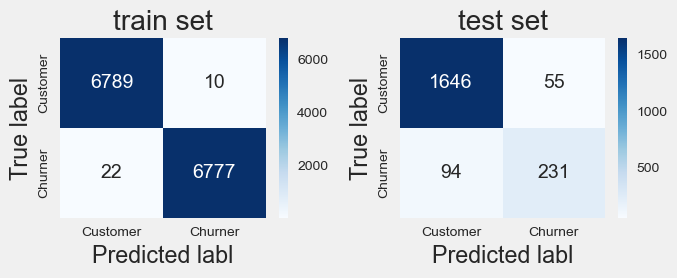

In [336]:
xgbc=XGBClassifier(random_state=2022)
model = xgbc.fit(X_train_sm, y_train_sm)
report_loss_cf('XGBClassifier', model, X_train_sm, y_train_sm, X_test, y_test, graph=1)

# <span style="color:magenta">9.3 XGBClassifier Optimization

Based on baseline performance, we will use XGBClassifier as model

In [ ]:
xgbc=XGBClassifier(random_state=2022)
model = xgbc.fit(X_train_sm, y_train_sm)
report_loss_cf('XGBClassifier', model, X_train_sm, y_train_sm, X_test, y_test, graph=1)

In [ ]:
model.get_params()

### Next, we will use RandomSearchCV and GridSearchCV to tune the parameters

In [ ]:
# for parameter tuning, let try randomsearchCV first, then use GridsearchCV to fine tune
# there are 7 (or 9 if use Lasso, ridge) parameters to tune a XGBoost model
# learning rate: [0.01, 0.05, 0.1]
# n_estimators: number of decision trees. Let try range(50,501,50)
# max_depth: 这个参数的取值最好在2-12之间. try range(4,12,2)
# min_child_weight: 和GBM的 min_sample_leaf 参数类似. For preventing overfitting. 
# gamma: 这个参数的值越大，算法越保守. try [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
# subsample: 减小这个参数的值，算法会更加保守，避免过拟合。但是，如果这个值设置得过小，它可能会导致欠拟合。
#               subsample, colsample_bytree = 0.8, 这个是最常见的初始值了。典型值的范围在0.5-1.0之间
# colsample_bytree: 和GBM里面的max_features参数类似。用来控制每棵随机采样的列数的占比(每一列是一个特征)。
#                   典型值：0.5-1
# reg_alpha: 权重的L1正则化项。(和Lasso regression类似). 可以应用在很高维度的情况下，使得算法的速度更快。
#             [0, 0.001, 0.005, 0.01, 0.05] or 0.0–1.0
# reg_lambda: 权重的L2正则化项。(和Ridge regression类似)。这个参数是用来控制XGBoost的正则化部分的。
#               虽然大部分数据科学家很少用到这个参数，但是这个参数在减少过拟合上还是可以挖掘出更多用处的。
#               0.0–1.0
import time
start = time.time()

param_xgbrs = {'learning_rate':[0.05, 0.1],
               'n_estimators':range(50,201,50),
               'max_depth':range(4,10,2), 
               'min_child_weight':range(6,15,4), 
               'gamma':[0.0, 0.25, 0.5],
               'subsample': [0.6, 0.8, 1.0],
               'colsample_bytree': [0.6, 0.8, 1.0],
               'reg_alpha':[1e-2, 0.1, 1, 100],
               'reg_lambda':[1e-2, 0.1, 1, 100],
              }

xgb_random = RandomizedSearchCV(estimator=XGBClassifier(), param_distributions=param_xgbrs, 
                n_iter=600, cv=5, random_state=2022, n_jobs=-1)
xgb_random.fit(X_train_sm, y_train_sm)

print(xgb_random.best_score_) 
print(xgb_random.best_params_)

end = time.time() 
print(f'This grid search session took {(end - start) / 60} minutes.')

Best parameters from Randomized SearchCV: 
{'subsample': 1.0, 
 'reg_lambda': 0.01, 
 'reg_alpha': 1, 
 'n_estimators': 50, 
 'min_child_weight': 6, 
 'max_depth': 8, 
 'learning_rate': 0.1, 
 'gamma': 0.0, 
 'colsample_bytree': 0.6}

In [ ]:
start = time.time()
params_xgbc = {'learning_rate':[0.05, 0.1],
               'n_estimators':[50, 75, 100],
               'max_depth':[6,8,10], 
               'min_child_weight':[6,8], 
               'gamma':[0.0, 0.2],
               'subsample': [0.8, 1.0],
               'colsample_bytree': [0.6, 0.8],
               'reg_alpha':[0.1, 1],
               'reg_lambda':[0.001, 0.01],
              }

grid_xgbc = GridSearchCV(XGBClassifier(), params_xgbc, cv=5, scoring = 'recall') 
grid_xgbc.fit(X_train_sm, y_train_sm) 

print(grid_xgbc.best_score_) 
print(grid_xgbc.best_params_)

end = time.time() 
print(f'This grid search session took {(end - start) / 60} minutes.')

/Users/xiaofwu-m1/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

/Users/xiaofwu-m1/opt/anaconda3/lib/python3.9/site-packages/xgboost/data.py:250: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



[21:23:26] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Model performance for:  XGBClassifier
train set accuracy: 0.987
train set precision: 0.982
train set recall: 0.992
train set f1 score: 0.987
training set AUC score: 0.999

test set accuracy: 0.956
test set precision: 0.845
test set recall: 0.886
test set f1 score: 0.865
test set AUC score: 0.988


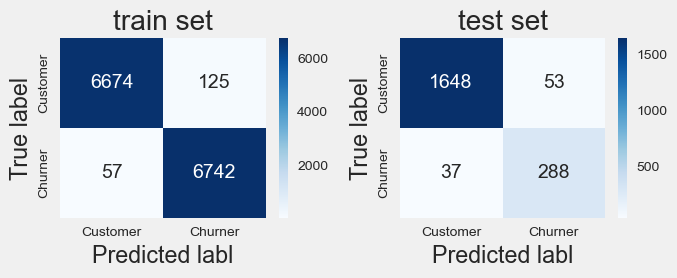

In [192]:
xgbc_opt=XGBClassifier(learning_rate=0.05, n_estimators=50, max_depth=8, min_child_weight=6,
                             gamma=0, subsample=1.0, colsample_bytree=0.6, reg_alpha=0.1, 
                             reg_lambda = 0.001, random_state=42)
model_opt = xgbc_opt.fit(X_train_sm, y_train_sm)
report_loss_cf('XGBClassifier', model_opt, X_train_sm, y_train_sm, X_test, y_test, graph=1)

### plot the feature inportance